In [1]:
import os
import sys
sys.path.append("C:\\Users\\"+os.getlogin()+"\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\PainClassifier")
from my_data_generator import *

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import os
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
import h5py
import warnings
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import precision_recall_fscore_support as score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
from datetime import datetime
import scipy as sp
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import auc, roc_curve
from itertools import cycle
from sklearn.metrics import RocCurveDisplay
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Reshape, Conv3D, MaxPooling3D, Flatten, Dropout, GlobalAveragePooling3D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold
import seaborn as sns
import pandas as pd
import nibabel as nib

# Metrics

In [3]:
def confusionmatrix(y_test,pred):
    #Construct the Confusion Matrix
    cm = confusion_matrix(y_test, preds)
    group_names = ['True Male','False Male','False Female','True Female']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         np.ndarray.flatten(cm/(np.sum(cm,axis=1).reshape(2,1)))]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm, annot=labels, fmt='', cmap='Blues', xticklabels = ['MALE','FEMALE'] ,yticklabels = ['MALE','FEMALE'])
    plt.show()

def ROC(probs,y_test): #binary
    #Classification Area under curve
     warnings.filterwarnings('ignore')
             
     auc = roc_auc_score(y_test, probs)
     print('AUC - Test Set: %.2f%%' % (auc*100))
    
     # calculate roc curve
     fpr, tpr, thresholds = roc_curve(y_test, probs)
     # plot no skill
     plt.plot([0, 1], [0, 1], linestyle='--')
     # plot the roc curve for the model
     plt.plot(fpr, tpr, marker='.')
     plt.xlabel('False positive rate')
     plt.ylabel('Sensitivity/ Recall')
     # show the plot
     plt.show()
    
     probs = (np.rint(probs)).astype(int)   
        
     precision = precision_score(y_test, probs)
     print('Precision: %f' % precision)
     # recall: tp / (tp + fn)
     recall = recall_score(y_test, probs)
     print('Recall: %f' % recall)
     # f1: tp / (tp + fp + fn)
     f1 = f1_score(y_test, probs)
     print('F1 score: %f' % f1)
        
def ROC_multiclass(model, y_test, n_class):
    #y_test: array size (# of subjects, ) with classes 
    #pretrained model to be evaluated 
    
    label_binarizer = LabelBinarizer().fit(y_test)
    y_onehot_test = label_binarizer.transform(y_test)
    y_onehot_test.shape  # (n_samples, n_classes)

    y_score = model.predict(X_test) # y_score is onehot
    
    # store the fpr, tpr, and roc_auc for all averaging strategies
    fpr, tpr, roc_auc = dict(), dict(), dict()
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")
    
    n_classes = n_class
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr_grid = np.linspace(0.0, 1.0, 1000)

    # Interpolate all ROC curves at these points
    mean_tpr = np.zeros_like(fpr_grid)

    for i in range(n_classes):
        mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

    # Average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = fpr_grid
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")
    
    target_names = ['Naive','Week1','Week7']

    fig, ax = plt.subplots(figsize=(6, 6))

    plt.plot(
        fpr["micro"],
        tpr["micro"],
        label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
        color="deeppink",
        linestyle=":",
        linewidth=4,
    )

    plt.plot(
        fpr["macro"],
        tpr["macro"],
        label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
        color="navy",
        linestyle=":",
        linewidth=4,
    )

    colors = cycle(["aqua", "darkorange", "cornflowerblue"])
    for class_id, color in zip(range(n_classes), colors):
        RocCurveDisplay.from_predictions(
            y_onehot_test[:, class_id],
            y_score[:, class_id],
            name=f"ROC curve for {target_names[class_id]}",
            color=color,
            ax=ax,
            plot_chance_level=(class_id == 2),
        )

    _ = ax.set(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title="Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass",
    )
    
# plot diagnostic learning curves
def summarize_diagnostics(histories):
    c = ['b','g','r','c','m','y','k','w']
    ltr = ['fold 1(train)','fold 2(train)','fold 3(train)','fold 4(train)','fold 5(train)']
    lts = ['fold 1(val)','fold 2(val)','fold 3(val)','fold 4(val)','fold 5(val)']
    for i in range(len(histories)):
        # plot loss
        plt.subplot(2, 1, 1)
        plt.title('Cross Entropy Loss')
        plt.plot(histories[i].history['loss'], color=c[i], label=ltr[i], linestyle="-")
        plt.plot(histories[i].history['val_loss'], color=c[i], label=lts[i], linestyle="--")
        # plot accuracy
        plt.subplot(2, 1, 2)
        plt.title('Classification Accuracy')
        plt.plot(histories[i].history['Accuracy'], color=c[i], label=ltr[i], linestyle="-")
        plt.plot(histories[i].history['val_Accuracy'], color=c[i], label=lts[i], linestyle="--")
    plt.legend()
    plt.show()

# summarize model performance
def summarize_performance(scores):
    # print summary
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (np.mean(scores)*100, np.std(scores)*100, len(scores)))
    # box and whisker plots of results
    plt.boxplot(scores)
    plt.show()  

# CAM generator

In [4]:
def show_cam(image_index, size, f, r, gw, xx_test):
    """Display the class activation map of a particular image"""
    features = f
    results = r

    # takes the features of the chosen image
    features_for_img = features[image_index, :, :, :, :]

    # get the class with the highest output probability
    prediction = np.argmax(results[image_index])

    # get the gap weights and the predicted class (shape 28x28)
    class_activation_weights = gw[:, prediction]

    # upsample the features to the image's original shape (128, 128, 22)
    class_activation_features = sp.ndimage.zoom(features_for_img, (48/size[0], 81/size[1], 48/size[2], 1), order=2)

    # compute the intesity of each feature in the CAM
    cam_output = np.dot(class_activation_features, class_activation_weights)

    print("Predicted class = "+ str(prediction) + ", Probabilty = " + str(results[image_index][prediction]))       
    
    fig = plt.figure(figsize=(12, 8))
    
    for i in range(len(np.array(xx_test)[0,0,0])):
        fig.add_subplot(8, 6, i+1)
        # show the upsampled image
        plt.imshow(np.array(xx_test)[image_index,:,:,i], alpha=0.8, cmap='Greys_r')

        # strongly classified (95% probability) images will be in green, else red
        if results[image_index][prediction]>0.95:
            cmap_str = "Greens"
        else:
            cmap_str = "Reds"

        # over the cam output
        plt.imshow(cam_output[:,:,i], cmap=cmap_str, alpha=0.4)
        
        plt.axis('off')
        # display the image
    plt.show()

def show_maps(desired_class, num_maps, size_features, f, r,gw, x_test):
    '''
    goes through the first 10,000 test images and generates CAMs 
    for the first `num_maps`(int) of the `desired_class`(int)
    '''
    counter = 0
    counter2 = 0
    results = np.asarray(r)

    if desired_class > 3:
        print("please choose a class less than 3")

    # go through the first 10000 images
    for i in range(0,10000):
        # break if we already displayed the specified number of maps
        if counter == num_maps:
            print("break")
            break
        if counter2 == len(results):
            print('No se encontro imagen con las caracteristicas deseadas')
            break

        # images that match the class will be shown
        if np.argmax(results[i]) == desired_class:
            if results[i][np.argmax(results[i])]>(results.max()-1):
                counter += 1
                show_cam(i, size_features, f, results,gw, x_test)
        counter2 += 1
                
def CAM_generator(model, clase_deseada, num_vols, test_set):
    gap_weights = model.layers[-1].get_weights()[0]

    cam_model = Model(inputs=model.input, 
                      outputs=(model.layers[-3].output, 
                               model.layers[-1].output))
    
    # get the features and results of the test images using the newly created model
    features, results = cam_model.predict(test_set)

    xx_test=[]
    for i in range(int(len(X_test)/5)):
        x,y = testgen[i]
        xx_test.extend(x)

    # shape of the features
    print("features shape: ", features.shape)
    print("results shape:  ", results.shape)
    
    idx = 0
    features_for_img = features[idx, :, :, :]

    print(f"The features for img index {idx} has shape (height, width, depth, num of features channels): ", features_for_img.shape)
    
    show_maps(desired_class=clase_deseada, num_maps=num_vols, size_features = features_for_img.shape, f = features, r = results,
              gw = gap_weights, x_test = xx_test)

# 3D CNN

In [5]:
def Conv3dNN(n_class):
    # Define the input layer
    inputs = Input(shape=(128, 128, 22), name='Input Layer')

    x = Reshape(target_shape=[128, 128, 22, 1], name='input_x_3d_volumes')(inputs)

    ## 1st layer: Conv_1        
    x = Conv3D(filters=16, kernel_size=(2, 2, 2), strides=(1, 1, 1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 2nd layer: Conv_2
    x = Conv3D(filters=32, kernel_size=(2, 2, 2), strides=(1,1,1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling 
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 3rd layer: Conv_3
    x = Conv3D(filters=64, kernel_size=(2, 2, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)
    
    ## 4rd layer: Conv_3
    #x = Conv3D(filters=40, kernel_size=(2, 2, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)
    
    ## MaxPooling 
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ##Flatten to make fully connected layer
    x = Flatten()(x)

    ##4th layer: Fully Connected
    x = Dense(128, activation=tf.keras.activations.relu)(x)

    ## Dropout
    x = Dropout(rate=0.1)(x)

    ## 5th layer: Fully Connected (linear activation)
    out = Dense(n_class, activation=tf.keras.activations.sigmoid)(x)

    ## model
    model = tf.keras.Model(inputs=[inputs], outputs=[out])
    
    return model

In [6]:
def Conv3dNN_from_paper(n_class):
    # Define the input layer
    #inputs = Input(shape=(128, 128, 22), name='Input Layer')

    #for just brain 
    inputs = Input(shape=(48, 81, 48), name='Input Layer')
    x = Reshape(target_shape=[48, 81, 48, 1], name='input_x_3d_volumes')(inputs)

    
    #x = Reshape(target_shape=[128, 128, 22, 1], name='input_x_3d_volumes')(inputs)

    ## 1st layer: Conv_1        
    x = Conv3D(filters=8, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 2nd layer: Conv_2
    x = Conv3D(filters=16, kernel_size=(3, 3, 3), strides=(1,1,1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling 
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 3rd layer: Conv_3
    x = Conv3D(filters=32, kernel_size=(3, 3, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)
    
    ## 4rd layer: Conv_3
    #x = Conv3D(filters=40, kernel_size=(2, 2, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)
    
    ## MaxPooling 
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ##Flatten to make fully connected layer
    x = Flatten()(x)

    ##4th layer: Fully Connected
    x = Dense(128, activation=tf.keras.activations.relu)(x)

    ## Dropout
    x = Dropout(rate=0.1)(x)

    ## 5th layer: Fully Connected (linear activation)
    out = Dense(n_class, activation=tf.keras.activations.sigmoid)(x)

    ## model
    model = tf.keras.Model(inputs=[inputs], outputs=[out])
    
    return model

# CAM Network

In [7]:
def Conv3dNN_cam(n_class):
    # Define the input layer
    inputs = Input(shape=(128, 128, 22), name='Input Layer')

    x = Reshape(target_shape=[128, 128, 22, 1], name='input_x_3d_volumes')(inputs)

    ## 1st layer: Conv_1        
    x = Conv3D(filters=16, kernel_size=(2, 2, 2), strides=(1, 1, 1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 2nd layer: Conv_2
    x = Conv3D(filters=32, kernel_size=(2, 2, 2), strides=(1,1,1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling 
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 3rd layer: Conv_3
    x = Conv3D(filters=64, kernel_size=(2, 2, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)
    
    ## 4rd layer: Conv_3
    #x = Conv3D(filters=40, kernel_size=(2, 2, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)

    ## Global average Pooling 
    x = GlobalAveragePooling3D()(x)

    ## 5th layer (in the original network): Fully Connected (linear activation)
    out = Dense(n_class, activation=tf.keras.activations.sigmoid)(x)

    ## model
    model = tf.keras.Model(inputs=[inputs], outputs=[out])
    
    return model

In [8]:
def Conv3dNN_cam_from_paper(n_class):
    # Define the input layer
    #inputs = Input(shape=(128, 128, 22), name='Input Layer')
    
    #for just brain 
    inputs = Input(shape=(48, 81, 48), name='Input Layer')
    x = Reshape(target_shape=[48, 81, 48, 1], name='input_x_3d_volumes')(inputs)

    
    #x = Reshape(target_shape=[128, 128, 22, 1], name='input_x_3d_volumes')(inputs)

    ## 1st layer: Conv_1        
    x = Conv3D(filters=8, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 2nd layer: Conv_2
    x = Conv3D(filters=16, kernel_size=(3, 3, 3), strides=(1,1,1), padding='valid', activation=tf.keras.activations.relu)(x)

    ## MaxPooling 
    x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

    ## 3rd layer: Conv_3
    x = Conv3D(filters=32, kernel_size=(3, 3, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)
    
    ## 4rd layer: Conv_3
    #x = Conv3D(filters=40, kernel_size=(2, 2, 2), strides=(1,1,1),padding='valid', activation=tf.keras.activations.relu)(x)

    ## Global average Pooling 
    x = GlobalAveragePooling3D()(x)

    ## 5th layer (in the original network): Fully Connected (linear activation)
    out = Dense(n_class, activation=tf.keras.activations.sigmoid)(x)

    ## model
    model = tf.keras.Model(inputs=[inputs], outputs=[out])
    
    return model

# Using my data generator

In [9]:
male = [57,59,60,73,74,93,94,95,96,97,98,99,100]
female = [49,50,51,52,65,66,78,79,80,81,82,83,84,77]

y_male = np.ones(len(male))
y_female = np.zeros(len(female))

subjects = np.array(male+female)
labels = np.array(list(y_male)+list(y_female))
sessions = [1,2,3]
MRI_type = "func"
functional_type = "rest"

In [38]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

scores, histories = list(), list()
scores_cam, histories_cam = list(), list()

for train_ix, test_ix in kfold.split(subjects, labels):
    sub_train = subjects[list(train_ix)]
    sub_train, sub_val, y_train, y_val  = train_test_split(sub_train, labels[list(train_ix)], test_size=0.1, random_state=42)
    sub_test = subjects[list(test_ix)]
    
    CPHclassTrain = FILES_and_LABELS(sub_train, sessions, MRI_type, functional_type)
    CPHclassTest = FILES_and_LABELS(sub_test, sessions, MRI_type, functional_type)
    CPHclassval = FILES_and_LABELS(sub_val, sessions, MRI_type, functional_type)
    
    X_train, y_train = CPHclassTrain.get_ID_filenames()
    X_test, y_test = CPHclassTest.get_ID_filenames()
    X_val, y_val = CPHclassval.get_ID_filenames()
    
    traingen = CustomDataGen(X_train, batch_size=2, format = "vol", vols = 80, num_class = 2, classes = "sex")
    testgen  = CustomDataGen(X_test, batch_size=2, format = "vol", vols=80, num_class = 2, classes = "sex")
    valgen  = CustomDataGen(X_val, batch_size=2, format = "vol",vols=80, num_class = 2, classes = "sex")
    
    #getting model 3D CNN
    #callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, min_delta=0.0001)
    print("Starting 3D CNN-----------------------------------------------------")
    CNN = Conv3dNN_from_paper(n_class = 2)
    CNN.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN.fit(traingen, epochs=20, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN): {}'.format(end_time - start_time))
    
    #print("predicts CNN")
    #preds = tf.cast(tf.argmax(CNN.predict(X_test), axis=1), tf.int32)
    
    print("evaluating CNN")
    _,acc = CNN.evaluate(testgen, verbose=1)
    
    scores.append(acc)
    histories.append(history)
    
    #print("CM CNN")
    #confusionmatrix(y_test, preds)
    
    #CNN CAM
    print("starting CAM model------------------------------------------------------")
    CNN_cam = Conv3dNN_cam_from_paper(n_class = 2)
    CNN_cam.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN_cam.fit(traingen, epochs=20, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN_cam): {}'.format(end_time - start_time))
    
    print("predicts CNN_cam")
    #preds = tf.cast(tf.argmax(CNN_cam.predict(X_test), axis=1), tf.int32)
    
    print("evaluating CNN_cam")
    _,acc = CNN_cam.evaluate(testgen, verbose=1)
    
    scores_cam.append(acc)
    histories_cam.append(history)
    
    #print("CM CNN_cam")
    #confusionmatrix(y_test, preds)
    print("")
    
    for i in range(train_y_onehot.shape[1]):
        print('CAM volumes, class ',i)
        CAM_generator(CNN_cam, i, 1)
        
print("histories and scores from CNN") 
summarize_diagnostics(histories)
summarize_performance(scores)

print("histories and scores from CNN_CAM") 
summarize_diagnostics(histories_cam)
summarize_performance(scores_cam)    

Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/20
27/27 [==============================] - 111s 4s/step - loss: 0.7203 - Accuracy: 0.5296 - val_loss: 0.7043 - val_Accuracy: 0.5297
Epoch 2/20
27/27 [==============================] - 93s 3s/step - loss: 0.6349 - Accuracy: 0.8083 - val_loss: 0.6752 - val_Accuracy: 0.5813
Epoch 3/20
27/27 [==============================] - 90s 3s/step - loss: 0.5694 - Accuracy: 0.8725 - val_loss: 0.6705 - val_Accuracy: 0.5359
Epoch 4/20
27/27 [==============================] - 90s 3s/step - loss: 0.5236 - Accuracy: 0.8197 - val_loss: 0.6069 - val_Accuracy: 0.7500
Epoch 5/20
27/27 [==============================] - 91s 3s/step - loss: 0.4714 - Accuracy: 0.9079 - val_loss: 0.5899 - val_Accuracy: 0.7406
Epoch 6/20
27/27 [==============================] - 86s 3s/step - loss: 0.4176 - Accuracy: 0.9780 - val_loss: 0.5566 - val_Accuracy: 0.7500
Epoch 7/20
27/27 [==============================] - 89s 3s/step - loss: 0.4425 - 

KeyboardInterrupt: 

# Just brain Female (cph) Vs Male (cph)

In [61]:
male = [57,59,60,73,74,93,94,95,96,98,99,100]
female = [49,50,51,52,65,66,77,78,79,80,81,82,83]

y_male = np.ones(len(male))
y_female = np.zeros(len(female))

subjects = np.array(male+female)
labels = np.array(list(y_male)+list(y_female))
sessions = [1,2,3]
MRI_type = "func"
functional_type = "rest"

Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 155s 17s/step - loss: 0.6864 - Accuracy: 0.4904 - val_loss: 0.6932 - val_Accuracy: 0.3717
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6734 - Accuracy: 0.4607 - val_loss: 0.6920 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 141s 16s/step - loss: 0.6596 - Accuracy: 0.4511 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 141s 16s/step - loss: 0.6411 - Accuracy: 0.4498 - val_loss: 0.6915 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 141s 16s/step - loss: 0.6319 - Accuracy: 0.4450 - val_loss: 0.6798 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 141s 16s/step - loss: 0.6148 - Accuracy: 0.4465 - val_loss: 0.6920 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 141s 16s/step - loss: 0.6207 - A

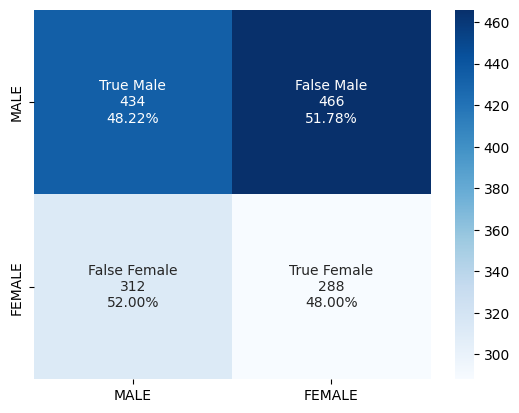

starting CAM model------------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 156s 18s/step - loss: 0.6930 - Accuracy: 0.5556 - val_loss: 0.6985 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6850 - Accuracy: 0.5556 - val_loss: 0.6959 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 142s 16s/step - loss: 0.6801 - Accuracy: 0.5556 - val_loss: 0.6910 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 142s 16s/step - loss: 0.6791 - Accuracy: 0.5556 - val_loss: 0.6865 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 142s 16s/step - loss: 0.6738 - Accuracy: 0.5556 - val_loss: 0.6841 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 142s 16s/step - loss: 0.6706 - Accuracy: 0.5556 - val_loss: 0.6813 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 142s 16s/step - loss: 0.6726

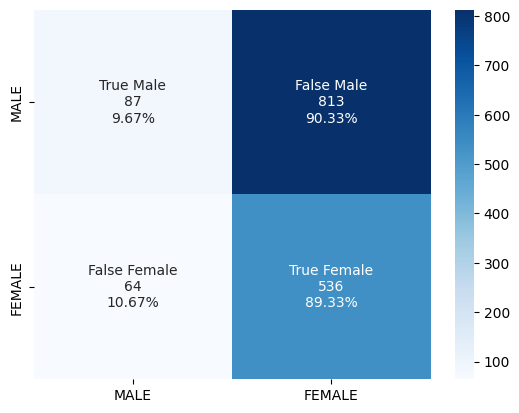


CAM volumes, class  0
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 0.5012986


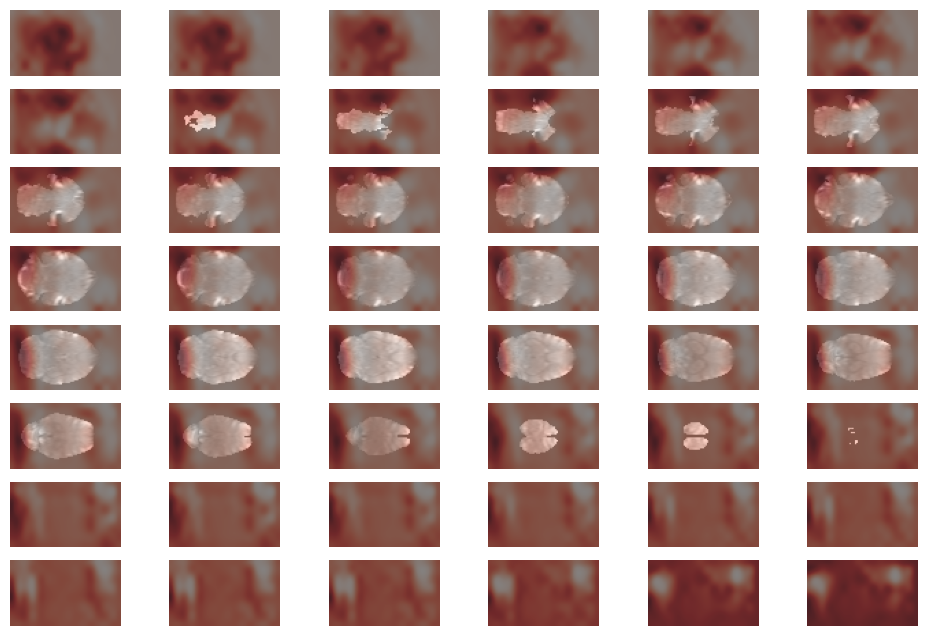

break
CAM volumes, class  1
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 1, Probabilty = 0.80562013


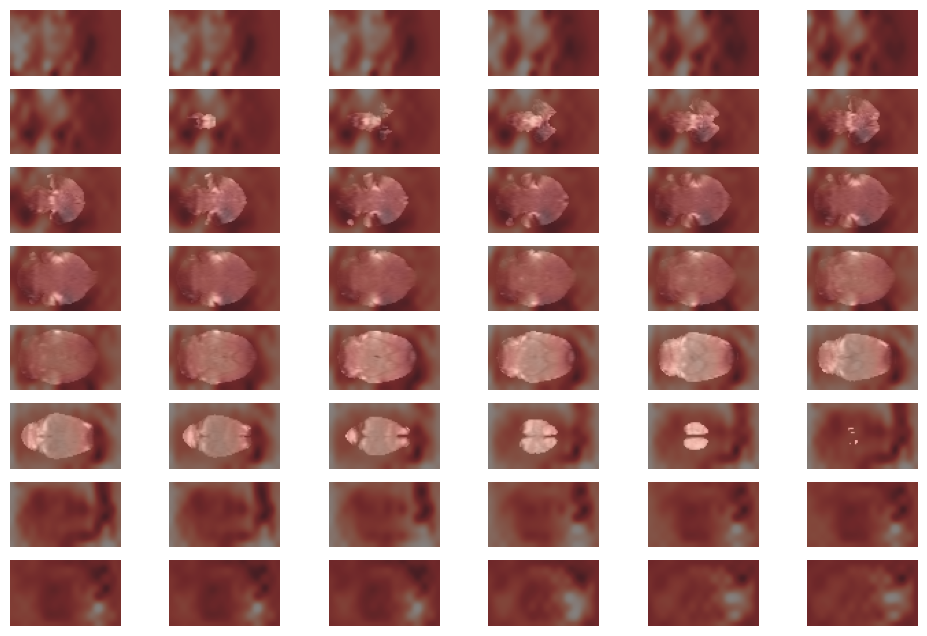

break
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 157s 18s/step - loss: 0.7412 - Accuracy: 0.5043 - val_loss: 0.6461 - val_Accuracy: 0.6650
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6845 - Accuracy: 0.5759 - val_loss: 0.6708 - val_Accuracy: 0.6517
Epoch 3/50
9/9 [==============================] - 142s 16s/step - loss: 0.7246 - Accuracy: 0.5783 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 141s 16s/step - loss: 0.6630 - Accuracy: 0.5963 - val_loss: 0.7104 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 142s 16s/step - loss: 0.6215 - Accuracy: 0.6939 - val_loss: 0.7292 - val_Accuracy: 0.5350
Epoch 6/50
9/9 [==============================] - 141s 16s/step - loss: 0.5957 - Accuracy: 0.6931 - val_loss: 0.7684 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 142s 16s/step - loss: 0.56

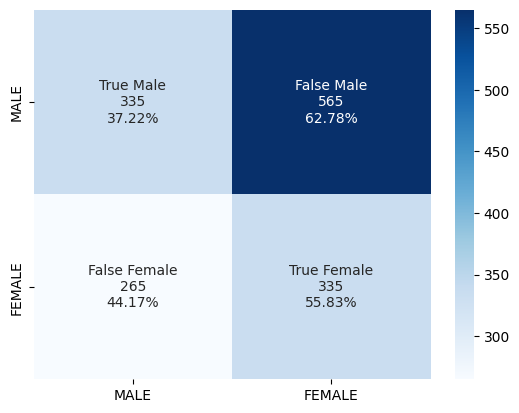

starting CAM model------------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 157s 18s/step - loss: 0.6807 - Accuracy: 0.5556 - val_loss: 0.7151 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 142s 16s/step - loss: 0.6729 - Accuracy: 0.5556 - val_loss: 0.7115 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 142s 16s/step - loss: 0.6719 - Accuracy: 0.5556 - val_loss: 0.7125 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 142s 16s/step - loss: 0.6744 - Accuracy: 0.5556 - val_loss: 0.7236 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 142s 16s/step - loss: 0.6712 - Accuracy: 0.5556 - val_loss: 0.7213 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 142s 16s/step - loss: 0.6708 - Accuracy: 0.5556 - val_loss: 0.7142 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 142s 16s/step - loss: 0.6699

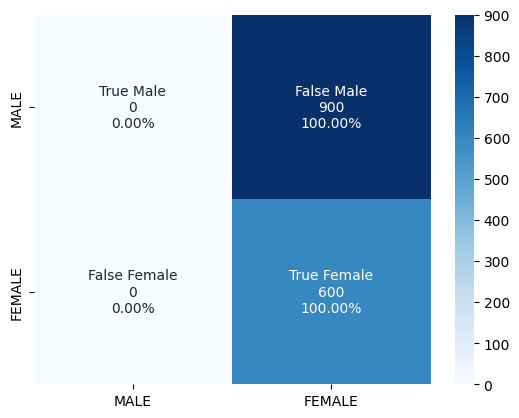


CAM volumes, class  0
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
CAM volumes, class  1
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 1, Probabilty = 0.69641846


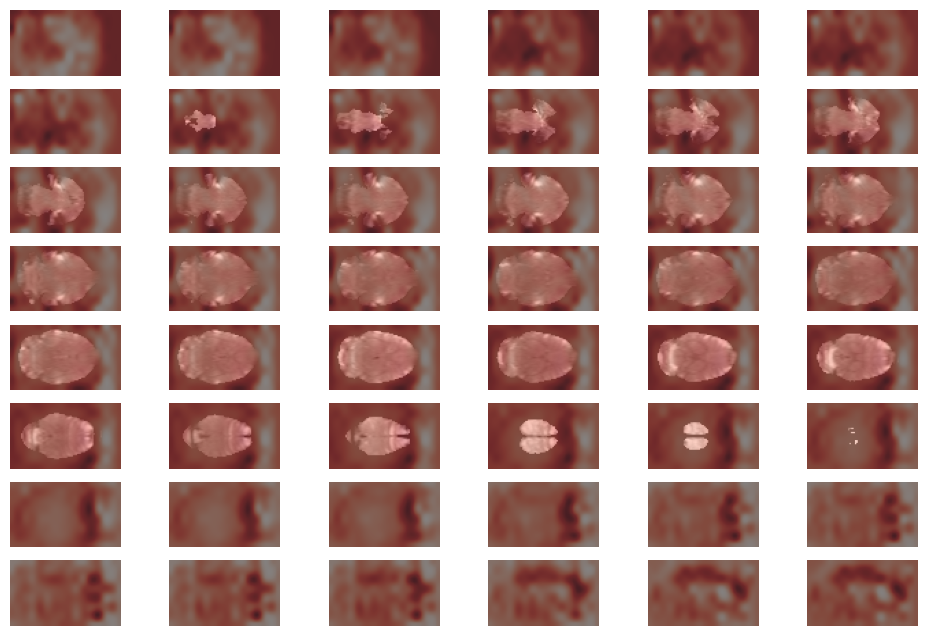

break
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 155s 18s/step - loss: 0.7228 - Accuracy: 0.5206 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6932 - Accuracy: 0.6159 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 141s 16s/step - loss: 0.6929 - Accuracy: 0.6739 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 142s 16s/step - loss: 0.6927 - Accuracy: 0.7117 - val_loss: 0.6931 - val_Accuracy: 0.3817
Epoch 5/50
9/9 [==============================] - 141s 16s/step - loss: 0.6925 - Accuracy: 0.5596 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 142s 16s/step - loss: 0.6815 - Accuracy: 0.5009 - val_loss: 0.6932 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 142s 16s/step - loss: 0.63

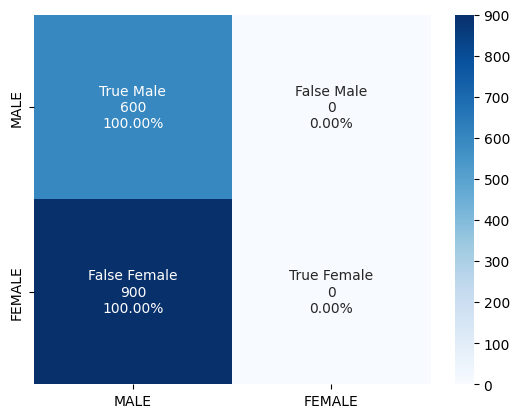

starting CAM model------------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 155s 18s/step - loss: 0.7048 - Accuracy: 0.5000 - val_loss: 0.6921 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6948 - Accuracy: 0.4698 - val_loss: 0.6891 - val_Accuracy: 0.6667
Epoch 3/50
9/9 [==============================] - 142s 16s/step - loss: 0.6927 - Accuracy: 0.5524 - val_loss: 0.6896 - val_Accuracy: 0.5017
Epoch 4/50
9/9 [==============================] - 142s 16s/step - loss: 0.6920 - Accuracy: 0.5689 - val_loss: 0.6889 - val_Accuracy: 0.8817
Epoch 5/50
9/9 [==============================] - 142s 16s/step - loss: 0.6925 - Accuracy: 0.5561 - val_loss: 0.6893 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 142s 16s/step - loss: 0.6905 - Accuracy: 0.6274 - val_loss: 0.6883 - val_Accuracy: 0.7317
Epoch 7/50
9/9 [==============================] - 142s 16s/step - loss: 0.6906

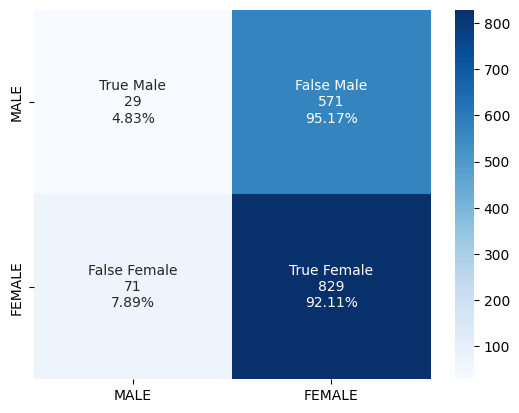


CAM volumes, class  0
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 0.7562976


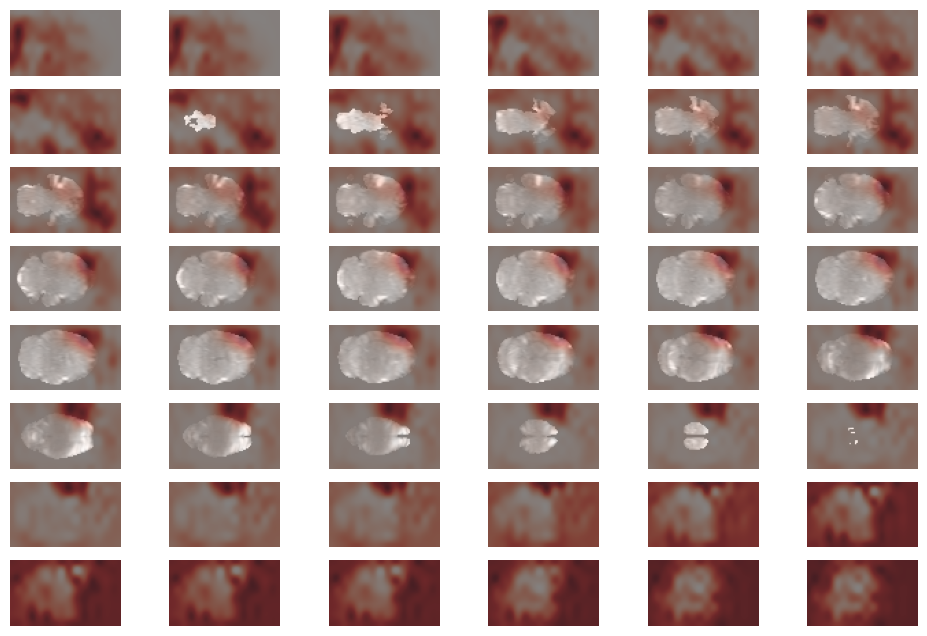

break
CAM volumes, class  1
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 1, Probabilty = 0.69601893


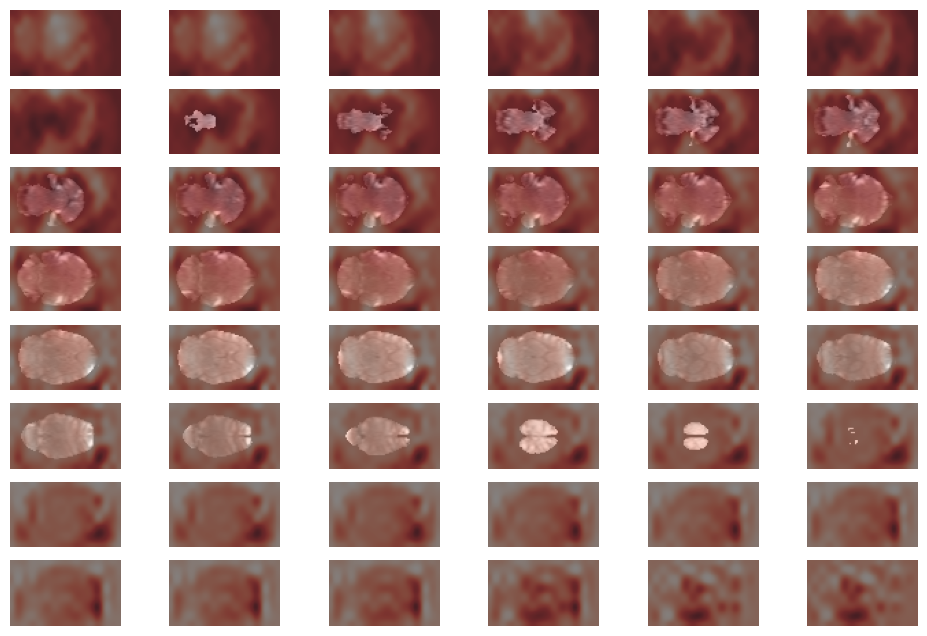

break
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 155s 18s/step - loss: 0.7178 - Accuracy: 0.4600 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6925 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 143s 16s/step - loss: 0.6929 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 142s 16s/step - loss: 0.6928 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 142s 16s/step - loss: 0.6927 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 142s 16s/step - loss: 0.6925 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 142s 16s/step - loss: 0.69

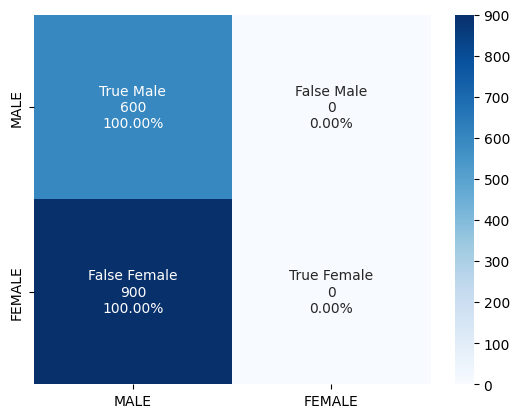

starting CAM model------------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 155s 17s/step - loss: 0.6909 - Accuracy: 0.5483 - val_loss: 0.6930 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6815 - Accuracy: 0.5000 - val_loss: 0.6939 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 141s 16s/step - loss: 0.6808 - Accuracy: 0.5000 - val_loss: 0.6954 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 141s 16s/step - loss: 0.6823 - Accuracy: 0.5000 - val_loss: 0.6941 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 141s 16s/step - loss: 0.6798 - Accuracy: 0.5000 - val_loss: 0.6930 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 141s 16s/step - loss: 0.6804 - Accuracy: 0.5000 - val_loss: 0.6932 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 141s 16s/step - loss: 0.6791

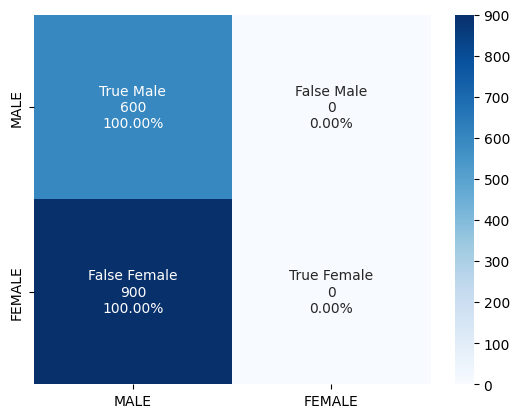


CAM volumes, class  0
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 0.4036707


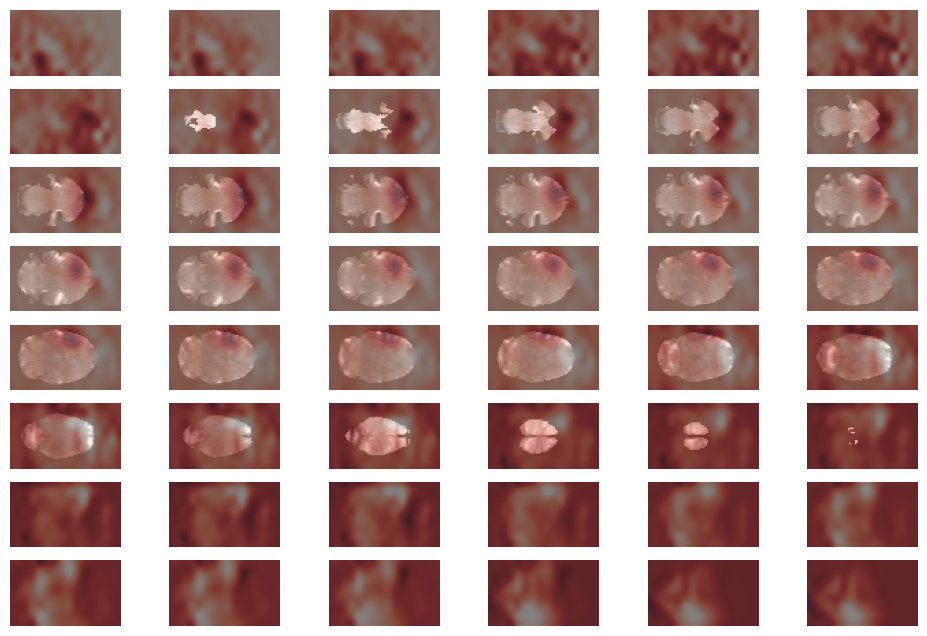

break
CAM volumes, class  1
3/3 [==============================] - 36s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 157s 18s/step - loss: 0.6998 - Accuracy: 0.4074 - val_loss: 0.6931 - val_Accuracy: 0.6633
Epoch 2/50
9/9 [==============================] - 141s 16s/step - loss: 0.6933 - Accuracy: 0.4156 - val_loss: 0.6931 - val_Accuracy: 0.4983
Epoch 3/50
9/9 [==============================] - 141s 16s/step - loss: 0.6927 - Accuracy: 0.4383 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 141s 16s/step - loss: 0.6925 - Accuracy: 0.4913 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 141s 16

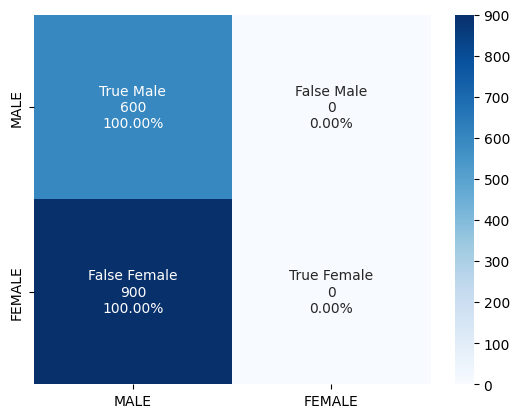

starting CAM model------------------------------------------------------
Training
Epoch 1/50
9/9 [==============================] - 157s 18s/step - loss: 0.6943 - Accuracy: 0.5093 - val_loss: 0.6901 - val_Accuracy: 0.5000
Epoch 2/50
9/9 [==============================] - 142s 16s/step - loss: 0.6903 - Accuracy: 0.5000 - val_loss: 0.6910 - val_Accuracy: 0.5000
Epoch 3/50
9/9 [==============================] - 143s 16s/step - loss: 0.6902 - Accuracy: 0.5000 - val_loss: 0.6907 - val_Accuracy: 0.5000
Epoch 4/50
9/9 [==============================] - 143s 16s/step - loss: 0.6895 - Accuracy: 0.5000 - val_loss: 0.6905 - val_Accuracy: 0.5000
Epoch 5/50
9/9 [==============================] - 143s 16s/step - loss: 0.6878 - Accuracy: 0.5000 - val_loss: 0.6898 - val_Accuracy: 0.5000
Epoch 6/50
9/9 [==============================] - 143s 16s/step - loss: 0.6877 - Accuracy: 0.5000 - val_loss: 0.6892 - val_Accuracy: 0.5000
Epoch 7/50
9/9 [==============================] - 143s 16s/step - loss: 0.6871

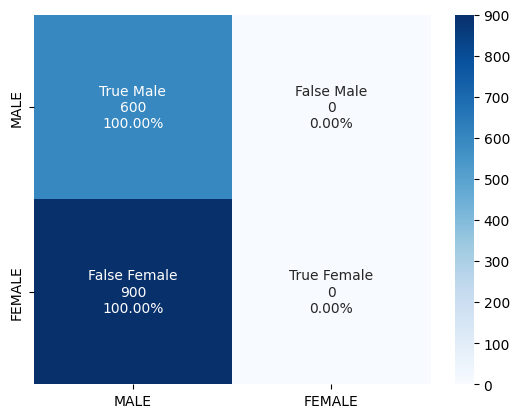


CAM volumes, class  0
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 0.9999993


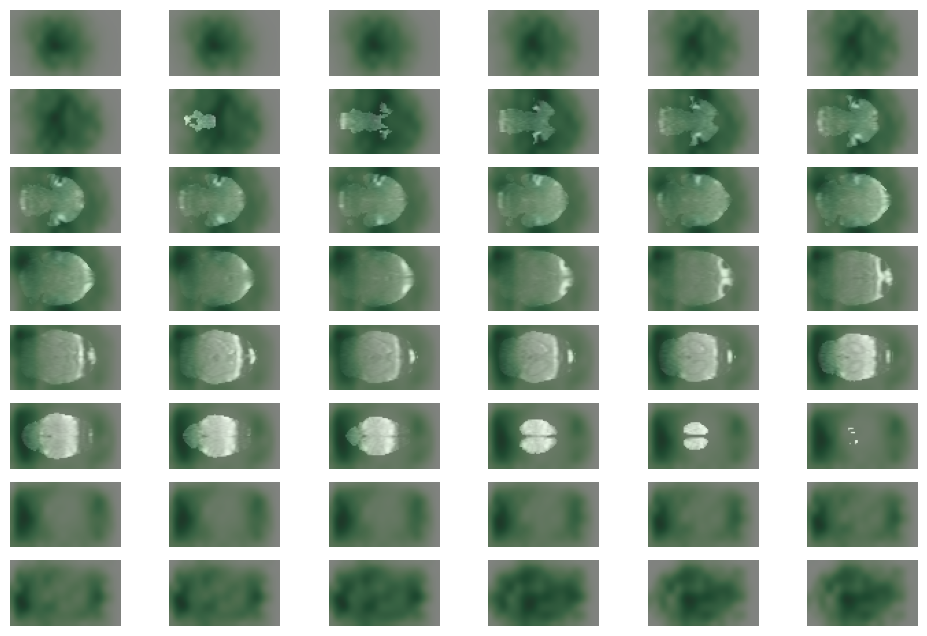

break
CAM volumes, class  1
3/3 [==============================] - 35s 12s/step
features shape:  (1500, 8, 16, 9, 32)
results shape:   (1500, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
histories and scores from CNN


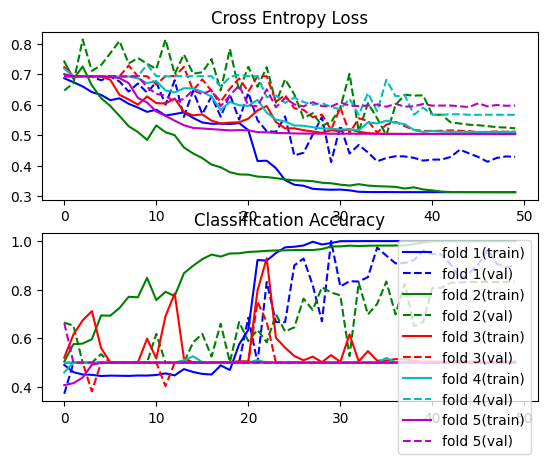

Accuracy: mean=53.840 std=17.291, n=5


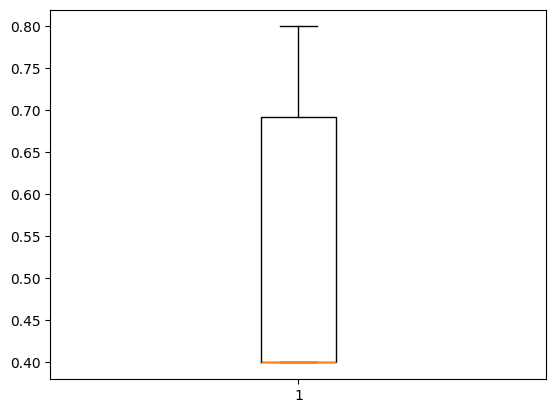

histories and scores from CNN_CAM


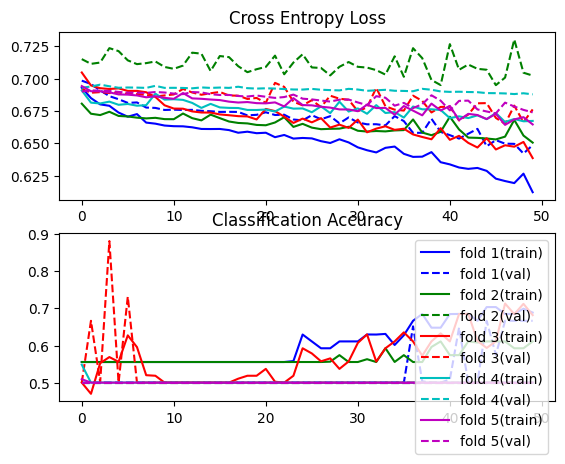

Accuracy: mean=45.987 std=10.417, n=5


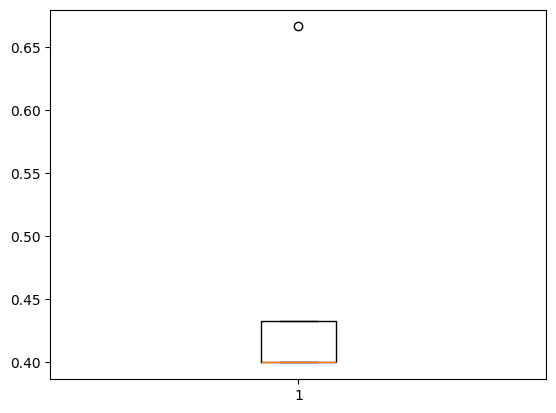

In [179]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

scores, histories = list(), list()
scores_cam, histories_cam = list(), list()

for train_ix, test_ix in kfold.split(subjects, labels):
    sub_train = subjects[list(train_ix)]
    sub_train, sub_val, y_train, y_val  = train_test_split(sub_train, labels[list(train_ix)], test_size=0.1, random_state=42)
    sub_test = subjects[list(test_ix)]
    
    CPHclassTrain = FILES_and_LABELS(sub_train, sessions, MRI_type, functional_type)
    CPHclassTest = FILES_and_LABELS(sub_test, sessions, MRI_type, functional_type)
    CPHclassval = FILES_and_LABELS(sub_val, sessions, MRI_type, functional_type)
        
    X_train = CPHclassTrain.get_mask_and_bold()
    X_test = CPHclassTest.get_mask_and_bold()
    X_val = CPHclassval.get_mask_and_bold()
    
    traingen = CustomDataGen(X_train, batch_size=6, format = "just_brain", vols = 100, num_class = 2, classes = "sex")
    #Es necesario que la division entre X_test y batch_size tenga un modulo igual a 0. De otra manera el ultimo batch no lo utiliza al utilizar .predict
    testgen  = CustomDataGen(X_test, batch_size=1, format = "just_brain", vols=100, num_class = 2, classes = "sex")
    valgen  = CustomDataGen(X_val, batch_size=6, format = "just_brain",vols=100, num_class = 2, classes = "sex")
    
    #getting model 3D CNN
    #callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, min_delta=0.0001)
    print("Starting 3D CNN-----------------------------------------------------")
    CNN = Conv3dNN_from_paper(n_class = 2)
    CNN.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN.fit(traingen, epochs=50, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN): {}'.format(end_time - start_time))

    y_test=[]
    for i in range(int(len(X_test)/1)):
        x,y = testgen[i]
        y_test.extend(y)
    y_test = np.argmax(y_test, axis=1)
    
    print("predicts CNN")
    preds = tf.cast(tf.argmax(CNN.predict(testgen), axis=1), tf.int32)
    
    print("evaluating CNN")
    _,acc = CNN.evaluate(testgen, verbose=1)
    
    scores.append(acc)
    histories.append(history)
    
    print("CM CNN")
    confusionmatrix(y_test, preds)
    
    #CNN CAM
    print("starting CAM model------------------------------------------------------")
    CNN_cam = Conv3dNN_cam_from_paper(n_class = 2)
    CNN_cam.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN_cam.fit(traingen, epochs=50, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN_cam): {}'.format(end_time - start_time))
    
    print("predicts CNN_cam")
    preds = tf.cast(tf.argmax(CNN_cam.predict(testgen), axis=1), tf.int32)
    
    print("evaluating CNN_cam")
    _,acc = CNN_cam.evaluate(testgen, verbose=1)
    
    scores_cam.append(acc)
    histories_cam.append(history)
    
    print("CM CNN_cam")
    confusionmatrix(y_test, preds)
    print("")
    
    for i in range(2):
        print('CAM volumes, class ',i)
        CAM_generator(CNN_cam, i, 1,testgen)
        
print("histories and scores from CNN") 
summarize_diagnostics(histories)
summarize_performance(scores)

print("histories and scores from CNN_CAM") 
summarize_diagnostics(histories_cam)
summarize_performance(scores_cam)    

# Just brain Female (Naive) vs Female (CPH) 

In [9]:
femaleCPHw1w7 = [49,50,51,52,65,66,77,78,79,80,81,82,
                 #83,
                ]
femaleCPHbaseline = [47,48,63,64,84]
femaleNaive3sess = [19,20,67,68,124]


y_CPH = np.ones(len(femaleCPHw1w7))
y_NAIVE = np.zeros(len(femaleCPHbaseline)+len(femaleNaive3sess))

subjects = np.array(femaleCPHw1w7+femaleCPHbaseline+femaleNaive3sess)
labels = np.array(list(y_CPH)+list(y_NAIVE))
#sessions = [1,2,3]
MRI_type = "func"
functional_type = "rest"

# sesiones CPH (W1 and W7) Train 14
# sesiones NAIVE (3 sessions) Train 14
# sesiones CPH baseline Train 3
# sesiones Train 31
# sesiones Test 8
# sesiones Val 4
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 113s 24s/step - loss: 0.7600 - Accuracy: 0.3887 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 2/50
5/5 [==============================] - 101s 21s/step - loss: 0.6932 - Accuracy: 0.4667 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 3/50
5/5 [==============================] - 101s 21s/step - loss: 0.6931 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 4/50
5/5 [==============================] - 101s 21s/step - loss: 0.6931 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 5/50
5/5 [==============================] - 101s 21s/step - loss: 0.6932 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 6/50
5/5 [==============================] - 101s 21s/s

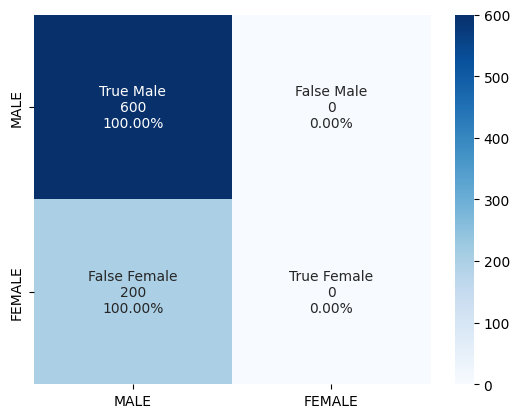

starting CAM model------------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 113s 24s/step - loss: 0.8799 - Accuracy: 0.4333 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 2/50
5/5 [==============================] - 101s 21s/step - loss: 0.8466 - Accuracy: 0.4667 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 3/50
5/5 [==============================] - 101s 21s/step - loss: 0.8799 - Accuracy: 0.4333 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 4/50
5/5 [==============================] - 102s 21s/step - loss: 0.8466 - Accuracy: 0.4667 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 5/50
5/5 [==============================] - 102s 21s/step - loss: 0.8799 - Accuracy: 0.4333 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 6/50
5/5 [==============================] - 102s 21s/step - loss: 0.8466 - Accuracy: 0.4667 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 7/50
5/5 [==============================] - 102s 21s/step - loss: 0.8466

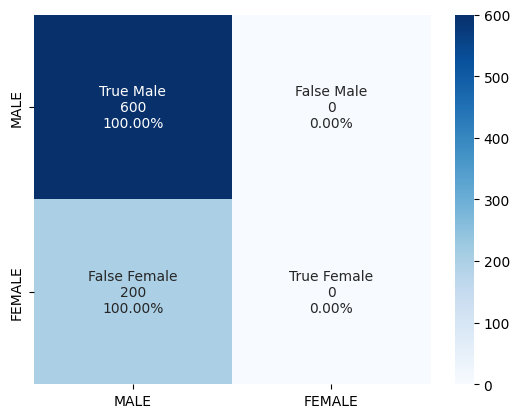


CAM volumes, class  0
1/1 [==============================] - 24s 24s/step
features shape:  (800, 8, 16, 9, 32)
results shape:   (800, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 1.0


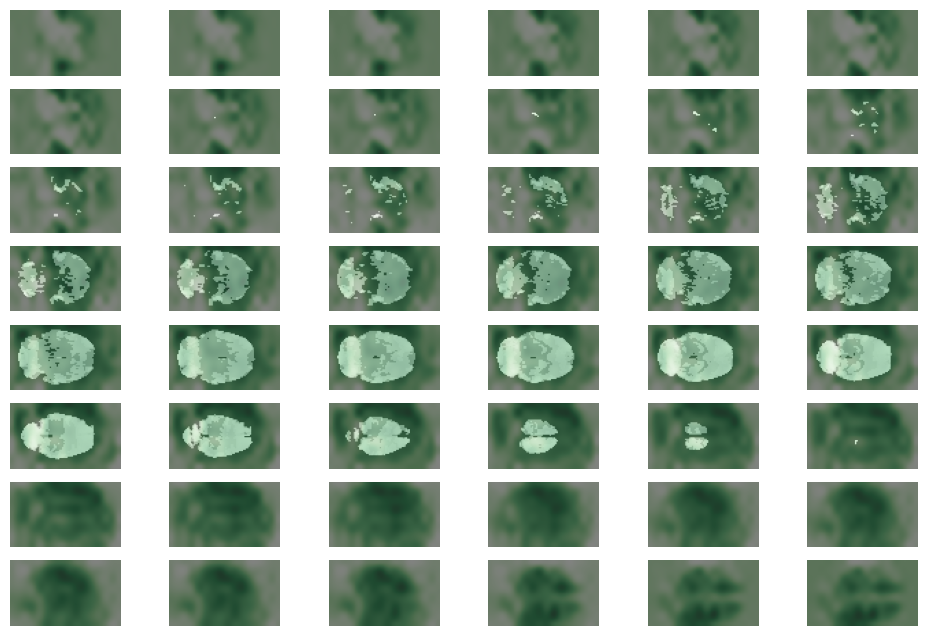

break
CAM volumes, class  1
1/1 [==============================] - 24s 24s/step
features shape:  (800, 8, 16, 9, 32)
results shape:   (800, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
# sesiones CPH (W1 and W7) Train 14
# sesiones NAIVE (3 sessions) Train 11
# sesiones CPH baseline Train 4
# sesiones Train 29
# sesiones Test 10
# sesiones Val 4
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
4/4 [==============================] - 96s 26s/step - loss: 0.7302 - Accuracy: 0.5833 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 2/50
4/4 [==============================] - 83s 22s/step - loss: 0.7716 - Accuracy: 0.5417 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 3/50
4/4 [==============================] - 83s 22s/step - loss: 0.8549 - Accuracy: 0.4583 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 4/50
4/4 [=======================

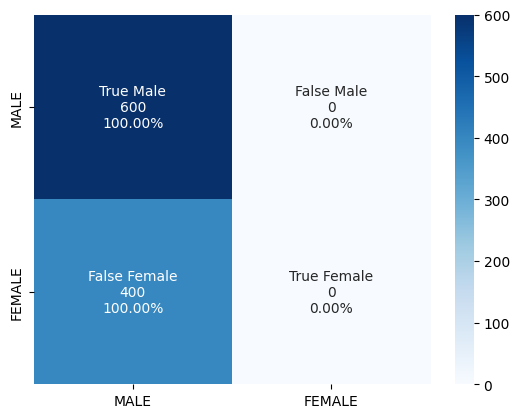

starting CAM model------------------------------------------------------
Training
Epoch 1/50
4/4 [==============================] - 96s 26s/step - loss: 0.6931 - Accuracy: 0.5417 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 2/50
4/4 [==============================] - 83s 22s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 3/50
4/4 [==============================] - 83s 22s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 4/50
4/4 [==============================] - 82s 21s/step - loss: 0.6931 - Accuracy: 0.5417 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 5/50
4/4 [==============================] - 83s 22s/step - loss: 0.6931 - Accuracy: 0.4583 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 6/50
4/4 [==============================] - 83s 21s/step - loss: 0.6931 - Accuracy: 0.4583 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 7/50
4/4 [==============================] - 82s 21s/step - loss: 0.6931 - Accu

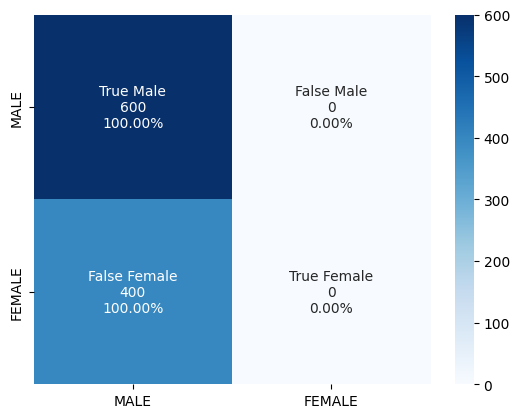


CAM volumes, class  0
1/1 [==============================] - 30s 30s/step
features shape:  (1000, 8, 16, 9, 32)
results shape:   (1000, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 3.622766e-10


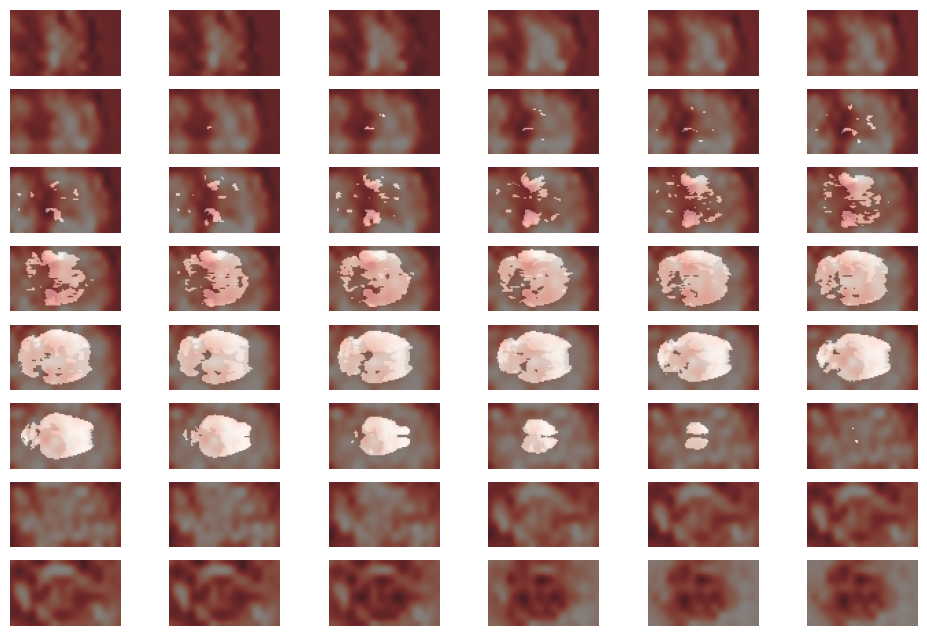

break
CAM volumes, class  1
1/1 [==============================] - 30s 30s/step
features shape:  (1000, 8, 16, 9, 32)
results shape:   (1000, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
# sesiones CPH (W1 and W7) Train 16
# sesiones NAIVE (3 sessions) Train 8
# sesiones CPH baseline Train 5
# sesiones Train 29
# sesiones Test 10
# sesiones Val 4
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
4/4 [==============================] - 94s 25s/step - loss: 0.7775 - Accuracy: 0.5129 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 2/50
4/4 [==============================] - 83s 22s/step - loss: 0.7716 - Accuracy: 0.5417 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 3/50
4/4 [==============================] - 83s 22s/step - loss: 0.7716 - Accuracy: 0.5417 - val_loss: 0.3133 - val_Accuracy: 1.0000
Epoch 4/50
4/4 [======================

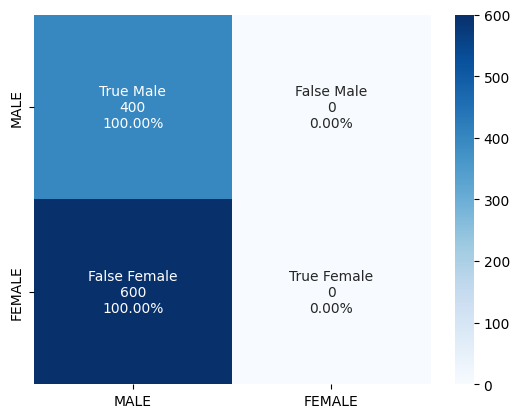

starting CAM model------------------------------------------------------
Training
Epoch 1/50
4/4 [==============================] - 95s 25s/step - loss: 0.7094 - Accuracy: 0.4583 - val_loss: 0.6981 - val_Accuracy: 0.0000e+00
Epoch 2/50
4/4 [==============================] - 83s 21s/step - loss: 0.6934 - Accuracy: 0.4167 - val_loss: 0.6939 - val_Accuracy: 0.0000e+00
Epoch 3/50
4/4 [==============================] - 83s 22s/step - loss: 0.6933 - Accuracy: 0.3750 - val_loss: 0.6932 - val_Accuracy: 0.1750
Epoch 4/50
4/4 [==============================] - 82s 21s/step - loss: 0.6931 - Accuracy: 0.4942 - val_loss: 0.6930 - val_Accuracy: 1.0000
Epoch 5/50
4/4 [==============================] - 82s 21s/step - loss: 0.6930 - Accuracy: 0.6538 - val_loss: 0.6927 - val_Accuracy: 1.0000
Epoch 6/50
4/4 [==============================] - 83s 21s/step - loss: 0.6932 - Accuracy: 0.5000 - val_loss: 0.6924 - val_Accuracy: 1.0000
Epoch 7/50
4/4 [==============================] - 83s 22s/step - loss: 0.693

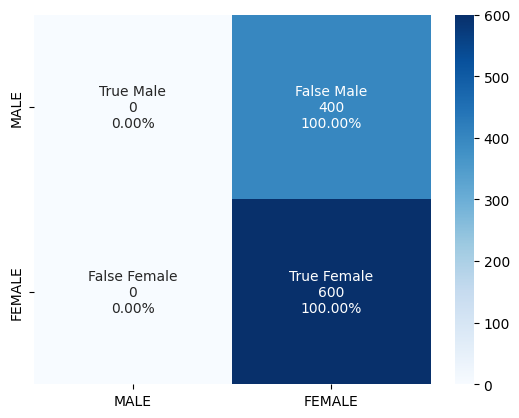


CAM volumes, class  0
1/1 [==============================] - 29s 29s/step
features shape:  (1000, 8, 16, 9, 32)
results shape:   (1000, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
CAM volumes, class  1
1/1 [==============================] - 29s 29s/step
features shape:  (1000, 8, 16, 9, 32)
results shape:   (1000, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 1, Probabilty = 0.9999999


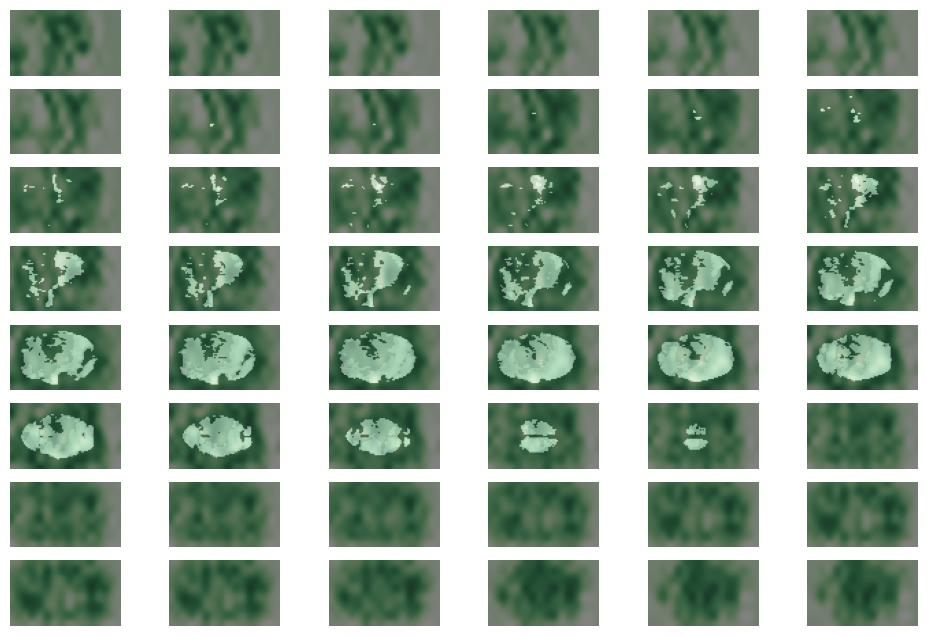

break
# sesiones CPH (W1 and W7) Train 16
# sesiones NAIVE (3 sessions) Train 12
# sesiones CPH baseline Train 4
# sesiones Train 32
# sesiones Test 7
# sesiones Val 4
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 112s 23s/step - loss: 0.9603 - Accuracy: 0.4463 - val_loss: 1.3133 - val_Accuracy: 0.0000e+00
Epoch 2/50
5/5 [==============================] - 100s 20s/step - loss: 0.7793 - Accuracy: 0.5333 - val_loss: 1.3133 - val_Accuracy: 0.0000e+00
Epoch 3/50
5/5 [==============================] - 100s 20s/step - loss: 0.8063 - Accuracy: 0.5000 - val_loss: 1.3132 - val_Accuracy: 0.0000e+00
Epoch 4/50
5/5 [==============================] - 100s 20s/step - loss: 0.7618 - Accuracy: 0.5100 - val_loss: 0.6931 - val_Accuracy: 0.7550
Epoch 5/50
5/5 [==============================] - 100s 20s/step - loss: 0.6943 - Accuracy: 0.4987 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 6/50
5/5 [==========================

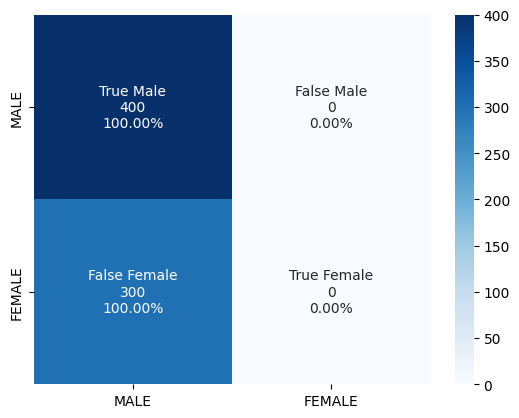

starting CAM model------------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 113s 23s/step - loss: 0.6938 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 2/50
5/5 [==============================] - 100s 20s/step - loss: 0.6931 - Accuracy: 0.4667 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 3/50
5/5 [==============================] - 100s 21s/step - loss: 0.6931 - Accuracy: 0.4667 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 4/50
5/5 [==============================] - 100s 20s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 5/50
5/5 [==============================] - 101s 21s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 6/50
5/5 [==============================] - 100s 20s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 7/50
5/5 [==============================] - 101s 21s/step - loss: 0.6931

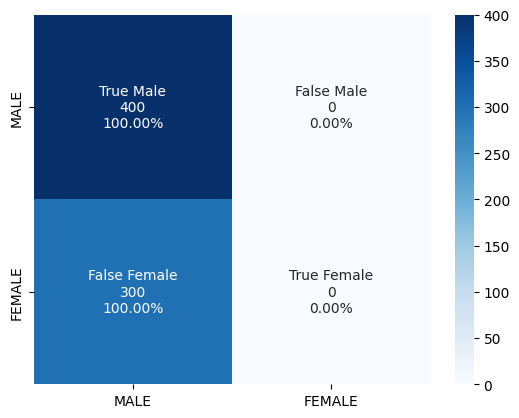


CAM volumes, class  0
1/1 [==============================] - 21s 21s/step
features shape:  (700, 8, 16, 9, 32)
results shape:   (700, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 1.0


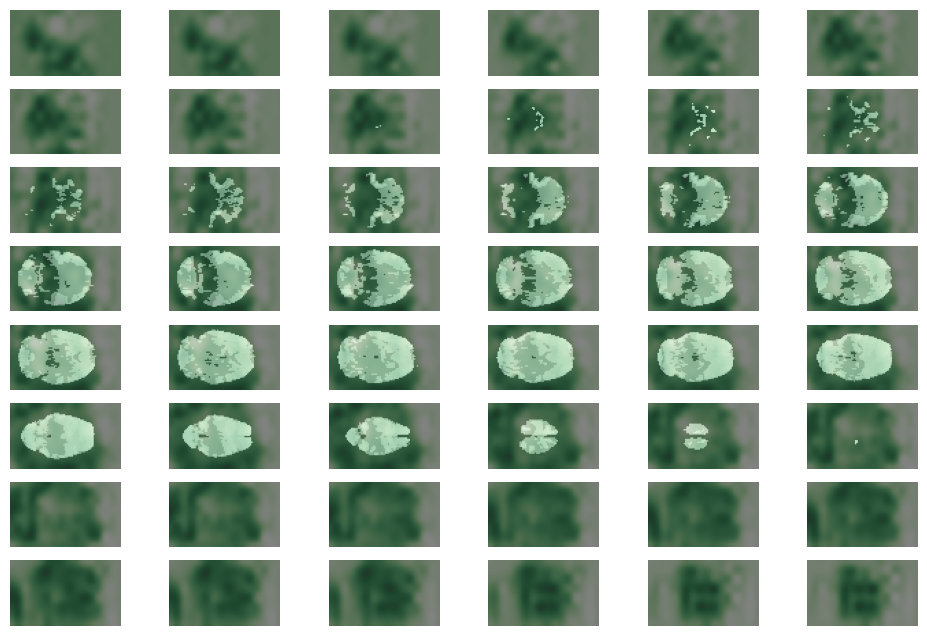

break
CAM volumes, class  1
1/1 [==============================] - 21s 21s/step
features shape:  (700, 8, 16, 9, 32)
results shape:   (700, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
# sesiones CPH (W1 and W7) Train 16
# sesiones NAIVE (3 sessions) Train 11
# sesiones CPH baseline Train 4
# sesiones Train 31
# sesiones Test 8
# sesiones Val 4
Starting 3D CNN-----------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 113s 24s/step - loss: 0.7547 - Accuracy: 0.3160 - val_loss: 0.6931 - val_Accuracy: 0.1925
Epoch 2/50
5/5 [==============================] - 100s 20s/step - loss: 0.6931 - Accuracy: 0.5853 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 3/50
5/5 [==============================] - 99s 20s/step - loss: 0.6931 - Accuracy: 0.5343 - val_loss: 0.6931 - val_Accuracy: 1.0000
Epoch 4/50
5/5 [======================

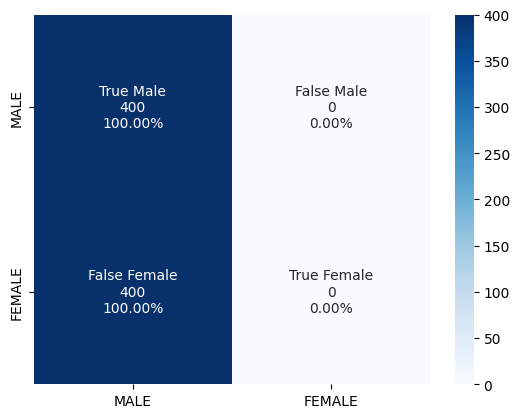

starting CAM model------------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 112s 23s/step - loss: 0.7255 - Accuracy: 0.5000 - val_loss: 0.7715 - val_Accuracy: 0.0000e+00
Epoch 2/50
5/5 [==============================] - 100s 20s/step - loss: 0.6942 - Accuracy: 0.5000 - val_loss: 0.7122 - val_Accuracy: 0.0000e+00
Epoch 3/50
5/5 [==============================] - 100s 20s/step - loss: 0.6937 - Accuracy: 0.4667 - val_loss: 0.7003 - val_Accuracy: 0.0000e+00
Epoch 4/50
5/5 [==============================] - 100s 21s/step - loss: 0.6927 - Accuracy: 0.5000 - val_loss: 0.6972 - val_Accuracy: 0.0000e+00
Epoch 5/50
5/5 [==============================] - 100s 21s/step - loss: 0.6930 - Accuracy: 0.5000 - val_loss: 0.6960 - val_Accuracy: 0.0000e+00
Epoch 6/50
5/5 [==============================] - 100s 20s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6952 - val_Accuracy: 0.0000e+00
Epoch 7/50
5/5 [==============================] - 100s

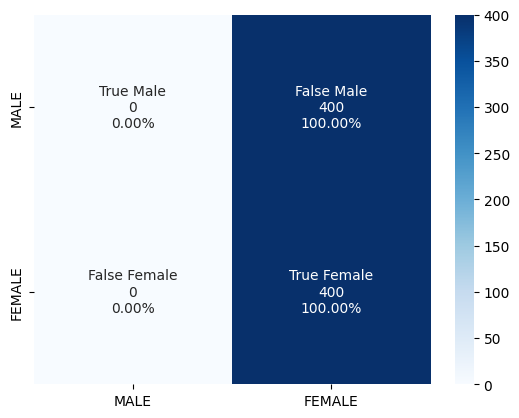


CAM volumes, class  0
1/1 [==============================] - 24s 24s/step
features shape:  (800, 8, 16, 9, 32)
results shape:   (800, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
CAM volumes, class  1
1/1 [==============================] - 24s 24s/step
features shape:  (800, 8, 16, 9, 32)
results shape:   (800, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 1, Probabilty = 0.0027240394


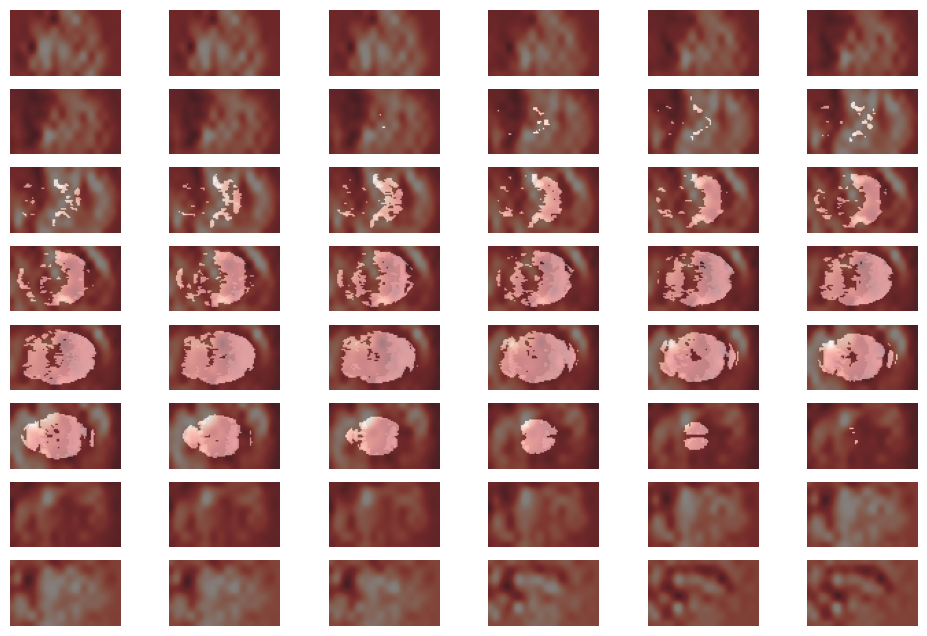

break
histories and scores from CNN


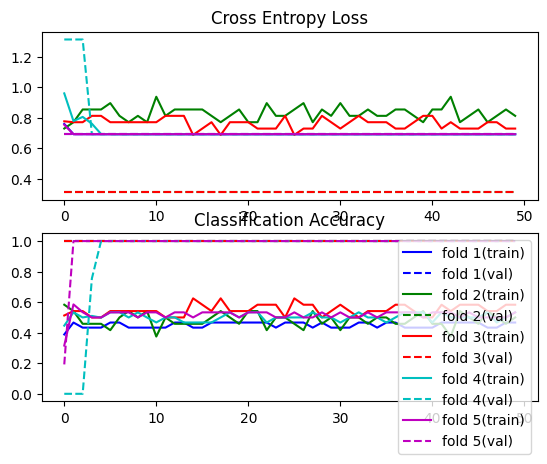

Accuracy: mean=56.429 std=11.571, n=5


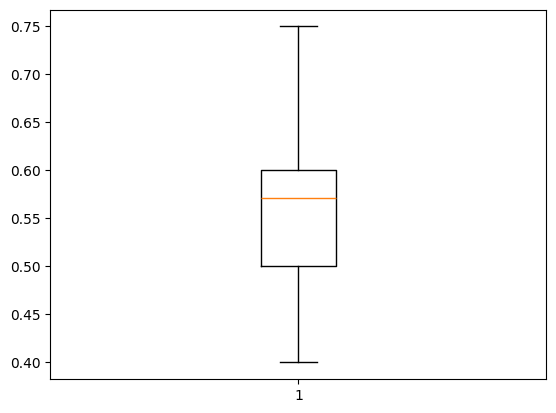

histories and scores from CNN_CAM


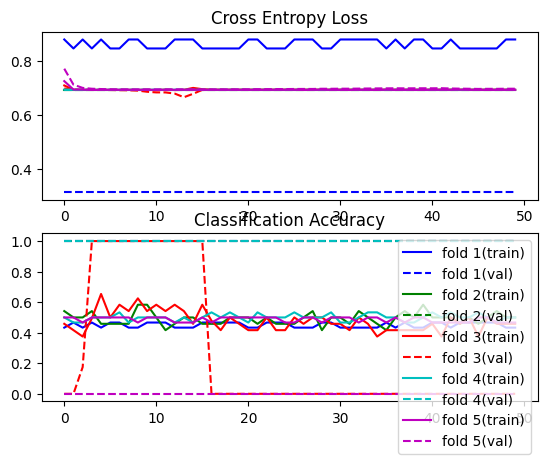

Accuracy: mean=60.429 std=8.152, n=5


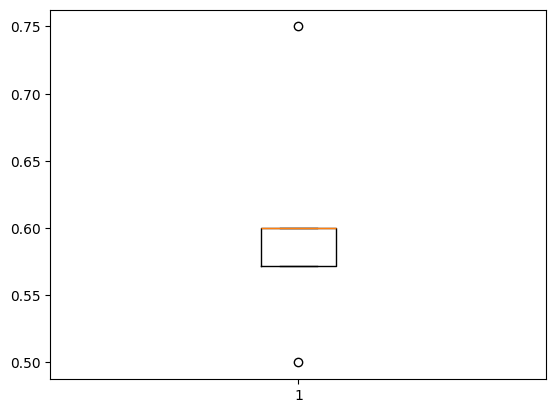

In [16]:
#Haciendo z scoring y histogram equalization en el data generator

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

scores, histories = list(), list()
scores_cam, histories_cam = list(), list()

for train_ix, test_ix in kfold.split(subjects, labels):
    sub_train = subjects[list(train_ix)]
    sub_train, sub_val, y_train, y_val  = train_test_split(sub_train, labels[list(train_ix)], test_size=0.1, random_state=42)
    sub_test = subjects[list(test_ix)]

    #Sujetos CPH con dos sesiones
    femaleCPHw1w7_train = []
    for i in sub_train:
        if i in femaleCPHw1w7:
            femaleCPHw1w7_train.append(i)
            
    femaleCPHw1w7_test = []
    for i in sub_test:
        if i in femaleCPHw1w7:
            femaleCPHw1w7_test.append(i)
    
    femaleCPHw1w7_val = []
    for i in sub_val:
        if i in femaleCPHw1w7:
            femaleCPHw1w7_val.append(i)

    #Sujetos NAIVE tres sesiones
    femaleNaive3sess_train = []
    for i in sub_train:
        if i in femaleNaive3sess:
            femaleNaive3sess_train.append(i)
            
    femaleNaive3sess_test = []
    for i in sub_test:
        if i in femaleNaive3sess:
            femaleNaive3sess_test.append(i)
    
    femaleNaive3sess_val = []
    for i in sub_val:
        if i in femaleNaive3sess:
            femaleNaive3sess_val.append(i)

    #Sujetos CPH baseline
    femaleCPHBl_train = []
    for i in sub_train:
        if i in femaleCPHbaseline:
            femaleCPHBl_train.append(i)
            
    femaleCPHBl_test = []
    for i in sub_test:
        if i in femaleCPHbaseline:
            femaleCPHBl_test.append(i)
    
    femaleCPHBl_val = []
    for i in sub_val:
        if i in femaleCPHbaseline:
            femaleCPHBl_val.append(i)

    #CPH W1 and W7 (train, test, val)
    CPHTrain = FILES_and_LABELS(femaleCPHw1w7_train, [2,3], MRI_type, functional_type)
    CPHTest = FILES_and_LABELS(femaleCPHw1w7_test, [2,3], MRI_type, functional_type)
    CPHVal = FILES_and_LABELS(femaleCPHw1w7_val, [2,3], MRI_type, functional_type)
        
    CPH_train_path = CPHTrain.get_mask_and_bold()
    CPH_test_path = CPHTest.get_mask_and_bold()
    CPH_val_path = CPHVal.get_mask_and_bold()
    
    #NAIVE three sessions
    NAIVE3Train = FILES_and_LABELS(femaleNaive3sess_train, [1,2,3], MRI_type, functional_type)
    NAIVE3Test = FILES_and_LABELS(femaleNaive3sess_test, [1,2,3], MRI_type, functional_type)
    NAIVE3Val = FILES_and_LABELS(femaleNaive3sess_val, [1,2,3], MRI_type, functional_type)
        
    NAIVE3_train_path = NAIVE3Train.get_mask_and_bold()
    NAIVE3_test_path = NAIVE3Test.get_mask_and_bold()
    NAIVE3_val_path = NAIVE3Val.get_mask_and_bold()
    
    #CPH Session 1 Baseline
    BL_CPHTrain = FILES_and_LABELS(femaleCPHBl_train, [1], MRI_type, functional_type)
    BL_CPHTest = FILES_and_LABELS(femaleCPHBl_test, [1], MRI_type, functional_type)
    BL_CPHVal = FILES_and_LABELS(femaleCPHBl_val, [1], MRI_type, functional_type)
        
    BL_CPH_train_path = BL_CPHTrain.get_mask_and_bold()
    BL_CPH_test_path = BL_CPHTest.get_mask_and_bold()
    BL_CPH_val_path = BL_CPHVal.get_mask_and_bold()
        
    X_train = CPH_train_path+NAIVE3_train_path+BL_CPH_train_path
    X_test =  CPH_test_path+NAIVE3_test_path+BL_CPH_test_path
    X_val = CPH_val_path+NAIVE3_val_path+BL_CPH_val_path

    print("# sesiones CPH (W1 and W7) Train",len(CPH_train_path))
    print("# sesiones NAIVE (3 sessions) Train",len(NAIVE3_train_path))
    print("# sesiones CPH baseline Train",len(BL_CPH_train_path))

    print("# sesiones Train",len(X_train))
    print("# sesiones Test",len(X_test))
    print("# sesiones Val",len(X_val))
    
    traingen = CustomDataGen(X_train, batch_size=6, format = "just_brain", vols = 100, num_class = 2, classes = "CPHvsNAIVE")
    #Es necesario que la division entre X_test y batch_size tenga un modulo igual a 0. De otra manera el ultimo batch no lo utiliza al utilizar .predict
    testgen  = CustomDataGen(X_test, batch_size=1, format = "just_brain", vols=100, num_class = 2, classes = "CPHvsNAIVE")
    valgen  = CustomDataGen(X_val, batch_size=len(X_val), format = "just_brain",vols=100, num_class = 2, classes = "CPHvsNAIVE")
    
    #getting model 3D CNN
    #callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, min_delta=0.0001)
    print("Starting 3D CNN-----------------------------------------------------")
    CNN = Conv3dNN_from_paper(n_class = 2)
    CNN.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN.fit(traingen, epochs=50, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN): {}'.format(end_time - start_time))

    y_test=[]
    for i in range(int(len(X_test)/1)):
        x,y = testgen[i]
        y_test.extend(y)
    y_test = np.argmax(y_test, axis=1)
    
    print("predicts CNN")
    preds = tf.cast(tf.argmax(CNN.predict(testgen), axis=1), tf.int32)
    
    print("evaluating CNN")
    _,acc = CNN.evaluate(testgen, verbose=1)
    
    scores.append(acc)
    histories.append(history)
    
    print("CM CNN")
    confusionmatrix(y_test, preds)
    
    #CNN CAM
    print("starting CAM model------------------------------------------------------")
    CNN_cam = Conv3dNN_cam_from_paper(n_class = 2)
    CNN_cam.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN_cam.fit(traingen, epochs=50, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN_cam): {}'.format(end_time - start_time))
    
    print("predicts CNN_cam")
    preds = tf.cast(tf.argmax(CNN_cam.predict(testgen), axis=1), tf.int32)
    
    print("evaluating CNN_cam")
    _,acc = CNN_cam.evaluate(testgen, verbose=1)
    
    scores_cam.append(acc)
    histories_cam.append(history)
    
    print("CM CNN_cam")
    confusionmatrix(y_test, preds)
    print("")
    
    for i in range(2):
        print('CAM volumes, class ',i)
        CAM_generator(CNN_cam, i, 1,testgen)
        
print("histories and scores from CNN") 
summarize_diagnostics(histories)
summarize_performance(scores)

print("histories and scores from CNN_CAM") 
summarize_diagnostics(histories_cam)
summarize_performance(scores_cam) 

# Just Brain Males (Naive) vs Males (CPH)

In [9]:
maleCPHw1w7 = [57,59,60,73,74,93,94,95,96,98,99,100]
maleCPHbaseline = [57,59,60,73,74,93,94,95,96,98,99,100]
maleNaive3sess = [24,28,75,76]


y_CPH = np.ones(len(maleCPHw1w7))
y_NAIVE = np.zeros(len(maleCPHbaseline)+len(maleNaive3sess))

subjects = np.array(maleCPHw1w7+maleCPHbaseline+maleNaive3sess)
labels = np.array(list(y_CPH)+list(y_NAIVE))
#sessions = [1,2,3]
MRI_type = "func"
functional_type = "rest"

sub train:
['C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id100.session02_split_name_sub-100_ses-02_desc-o_T2w/_run_None/sub-100_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-001_rest/bold_datasink/commonspace_bold/_scan_info_subject_id060.session02_split_name_sub-060_ses-02_desc-o_T2w/_run_None/sub-060_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id093.session02_split_name_sub-093_ses-02_desc-o_T2w/_run_None/sub-093_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id095.session02_split_name_sub-095_ses-02_desc-o_T2w/_run_None/sub-095_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/p

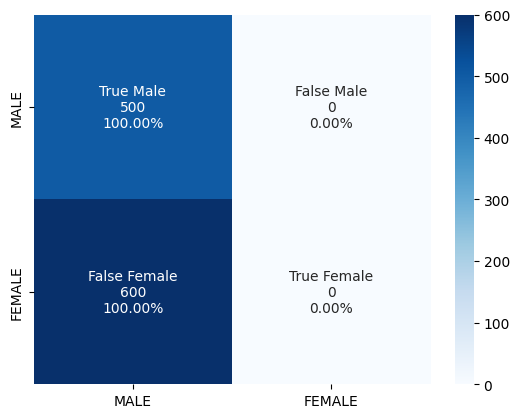

starting CAM model------------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 107s 22s/step - loss: 0.8466 - Accuracy: 0.4667 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 2/50
5/5 [==============================] - 95s 19s/step - loss: 0.8133 - Accuracy: 0.5000 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 3/50
5/5 [==============================] - 95s 20s/step - loss: 0.7799 - Accuracy: 0.5333 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 4/50
5/5 [==============================] - 95s 19s/step - loss: 0.8133 - Accuracy: 0.5000 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 5/50
5/5 [==============================] - 95s 20s/step - loss: 0.8466 - Accuracy: 0.4667 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 6/50
5/5 [==============================] - 96s 20s/step - loss: 0.8466 - Accuracy: 0.4667 - val_loss: 0.8133 - val_Accuracy: 0.5000
Epoch 7/50
5/5 [==============================] - 96s 20s/step - loss: 0.8133 - Acc

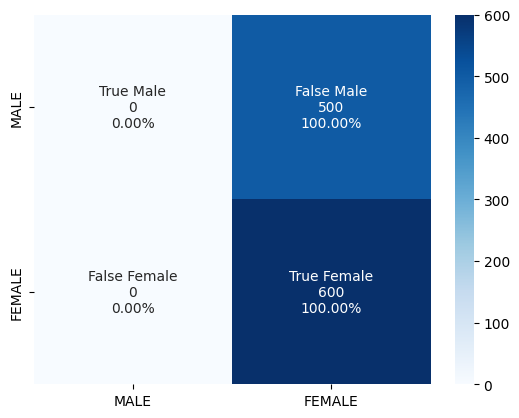


CAM volumes, class  0
1/1 [==============================] - 31s 31s/step
features shape:  (1100, 8, 16, 9, 32)
results shape:   (1100, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
CAM volumes, class  1
1/1 [==============================] - 31s 31s/step
features shape:  (1100, 8, 16, 9, 32)
results shape:   (1100, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 1, Probabilty = 1.0


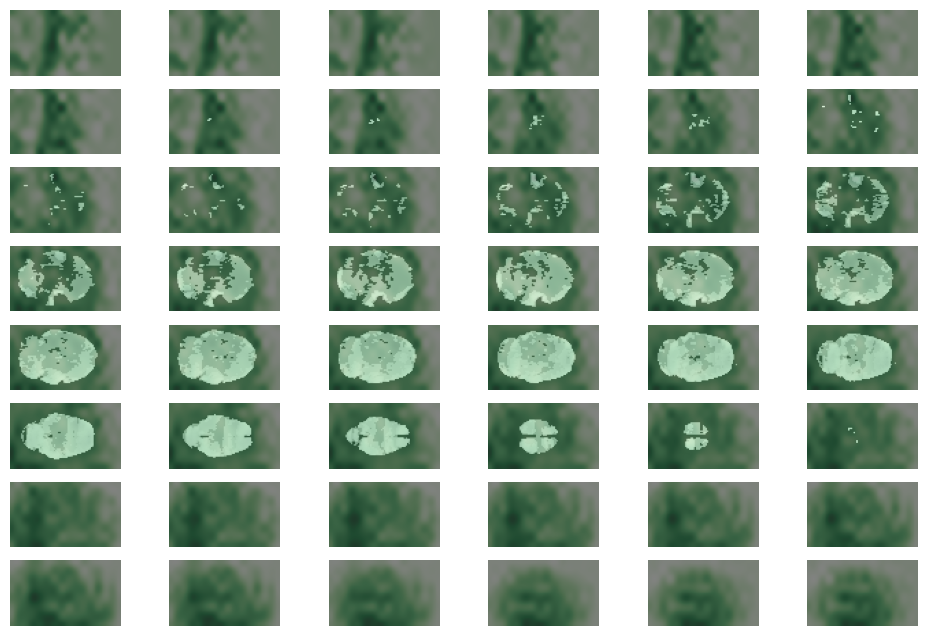

break
sub train:
['C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id099.session02_split_name_sub-099_ses-02_desc-o_T2w/_run_None/sub-099_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id073.session02_split_name_sub-073_ses-02_desc-o_T2w/_run_None/sub-073_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id093.session02_split_name_sub-093_ses-02_desc-o_T2w/_run_None/sub-093_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id094.session02_split_name_sub-094_ses-02_desc-o_T2w/_run_None/sub-094_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/ra

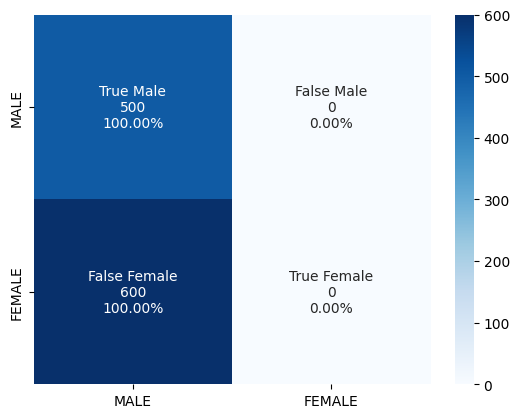

starting CAM model------------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 107s 22s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 2/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 3/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.5333 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 4/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 5/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.5333 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 6/50
5/5 [==============================] - 95s 20s/step - loss: 0.6931 - Accuracy: 0.4667 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 7/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Acc

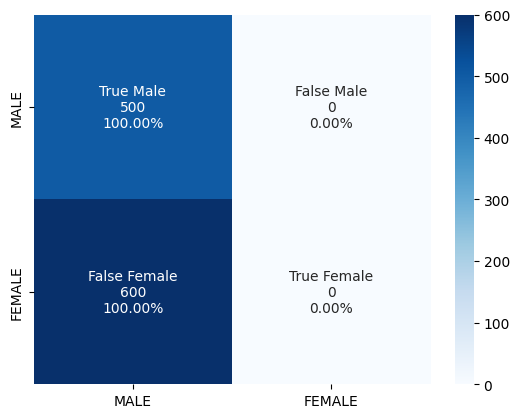


CAM volumes, class  0
1/1 [==============================] - 31s 31s/step
features shape:  (1100, 8, 16, 9, 32)
results shape:   (1100, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 1.0


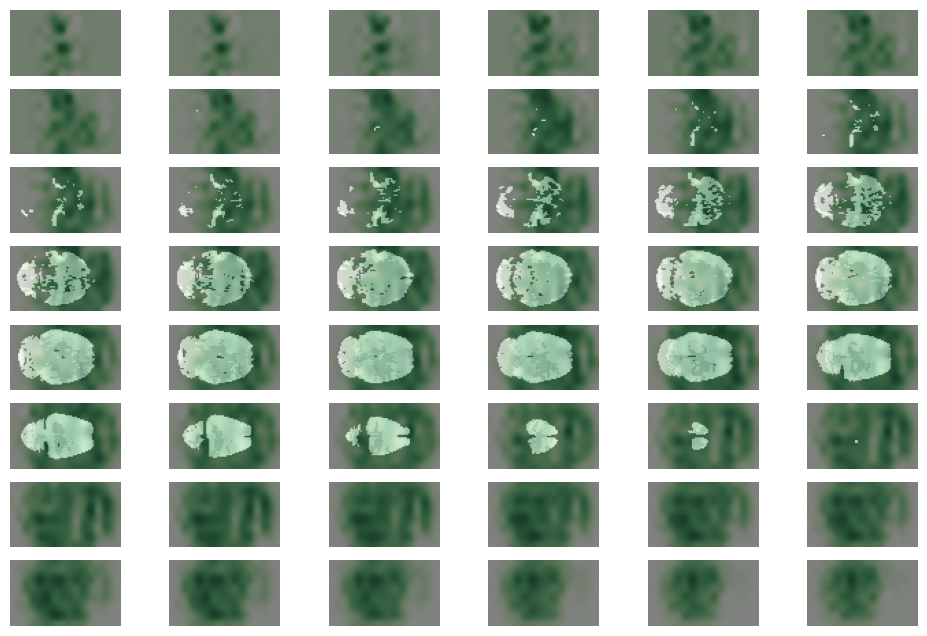

break
CAM volumes, class  1
1/1 [==============================] - 31s 31s/step
features shape:  (1100, 8, 16, 9, 32)
results shape:   (1100, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
sub train:
['C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id100.session02_split_name_sub-100_ses-02_desc-o_T2w/_run_None/sub-100_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-001_rest/bold_datasink/commonspace_bold/_scan_info_subject_id059.session02_split_name_sub-059_ses-02_desc-o_T2w/_run_None/sub-059_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id073.session02_split_name_sub-073_ses-02_desc-o_T2w/_run_None/sub-073_ses-02_task-rest_desc-oa_

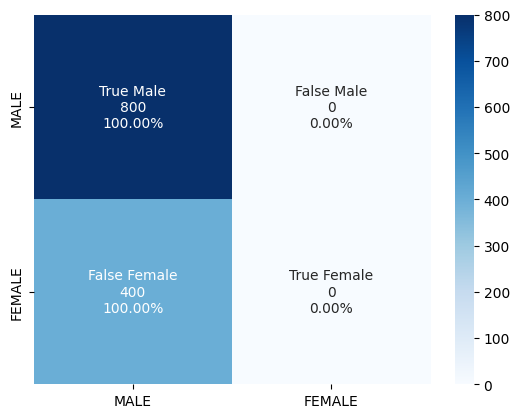

starting CAM model------------------------------------------------------
Training
Epoch 1/50
5/5 [==============================] - 107s 22s/step - loss: 0.7000 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 2/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 3/50
5/5 [==============================] - 95s 20s/step - loss: 0.6931 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 4/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.4667 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 5/50
5/5 [==============================] - 95s 20s/step - loss: 0.6931 - Accuracy: 0.4667 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 6/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Accuracy: 0.4333 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 7/50
5/5 [==============================] - 95s 19s/step - loss: 0.6931 - Acc

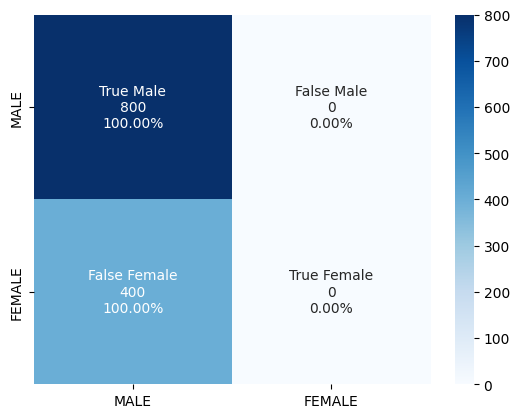


CAM volumes, class  0
1/1 [==============================] - 35s 35s/step
features shape:  (1200, 8, 16, 9, 32)
results shape:   (1200, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 1.0


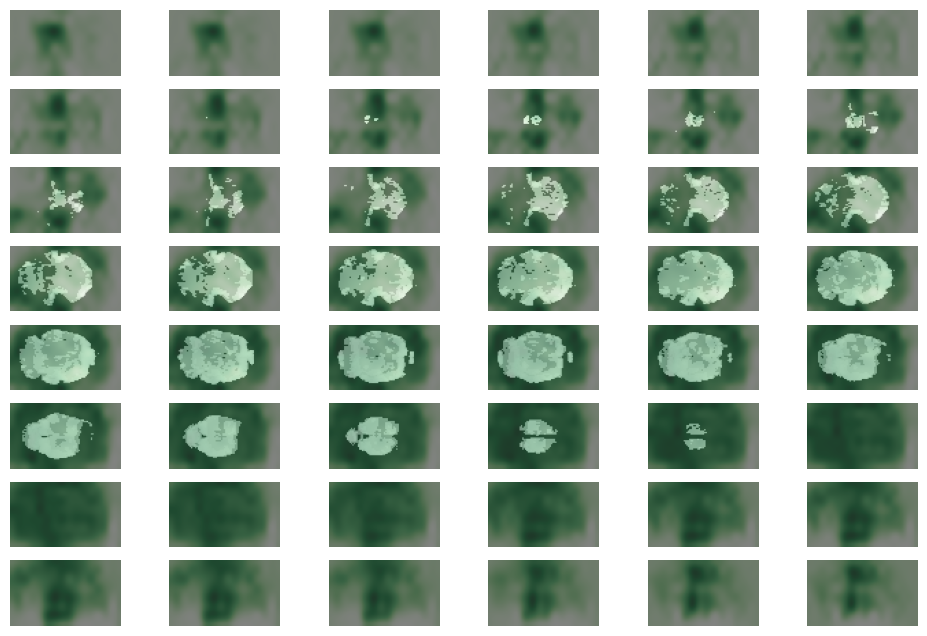

break
CAM volumes, class  1
1/1 [==============================] - 35s 35s/step
features shape:  (1200, 8, 16, 9, 32)
results shape:   (1200, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
sub train:
['C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id100.session02_split_name_sub-100_ses-02_desc-o_T2w/_run_None/sub-100_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id074.session02_split_name_sub-074_ses-02_desc-o_T2w/_run_None/sub-074_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-001_rest/bold_datasink/commonspace_bold/_scan_info_subject_id059.session02_split_name_sub-059_ses-02_desc-o_T2w/_run_None/sub-059_ses-02_task-rest_desc-oa_

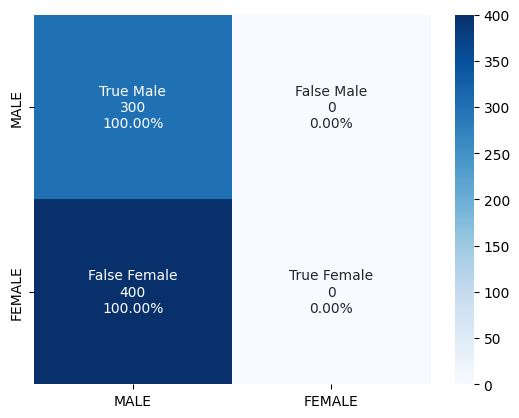

starting CAM model------------------------------------------------------
Training
Epoch 1/50
6/6 [==============================] - 124s 21s/step - loss: 0.7581 - Accuracy: 0.5000 - val_loss: 0.6976 - val_Accuracy: 0.5000
Epoch 2/50
6/6 [==============================] - 113s 19s/step - loss: 0.6933 - Accuracy: 0.4722 - val_loss: 0.6941 - val_Accuracy: 0.5000
Epoch 3/50
6/6 [==============================] - 112s 19s/step - loss: 0.6941 - Accuracy: 0.4722 - val_loss: 0.6933 - val_Accuracy: 0.5000
Epoch 4/50
6/6 [==============================] - 112s 19s/step - loss: 0.6932 - Accuracy: 0.4447 - val_loss: 0.6931 - val_Accuracy: 0.7800
Epoch 5/50
6/6 [==============================] - 113s 19s/step - loss: 0.6932 - Accuracy: 0.3914 - val_loss: 0.6930 - val_Accuracy: 0.5000
Epoch 6/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931 - Accuracy: 0.5556 - val_loss: 0.6930 - val_Accuracy: 0.5000
Epoch 7/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931

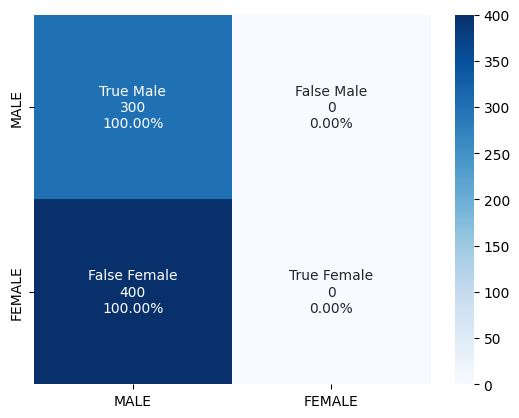


CAM volumes, class  0
1/1 [==============================] - 20s 20s/step
features shape:  (700, 8, 16, 9, 32)
results shape:   (700, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 0.9998258


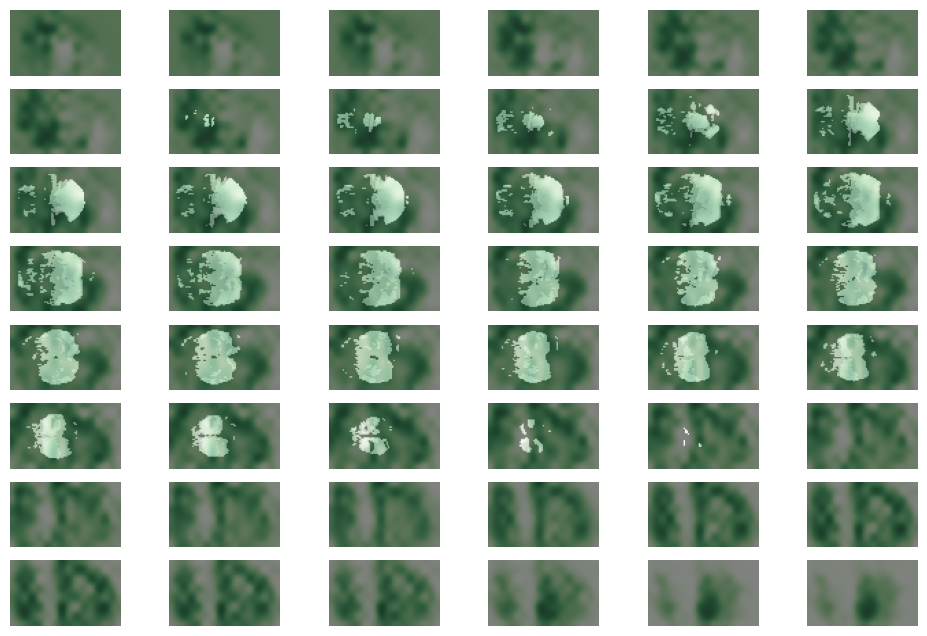

break
CAM volumes, class  1
1/1 [==============================] - 20s 20s/step
features shape:  (700, 8, 16, 9, 32)
results shape:   (700, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
sub train:
['C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id100.session02_split_name_sub-100_ses-02_desc-o_T2w/_run_None/sub-100_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-002_rest/bold_datasink/commonspace_bold/_scan_info_subject_id093.session02_split_name_sub-093_ses-02_desc-o_T2w/_run_None/sub-093_ses-02_task-rest_desc-oa_bold_autobox_combined.nii.gz'
 'C:/Users/gdaalumno/Desktop/rabies/preprocess_batch-001_rest/bold_datasink/commonspace_bold/_scan_info_subject_id059.session02_split_name_sub-059_ses-02_desc-o_T2w/_run_None/sub-059_ses-02_task-rest_desc-oa_bo

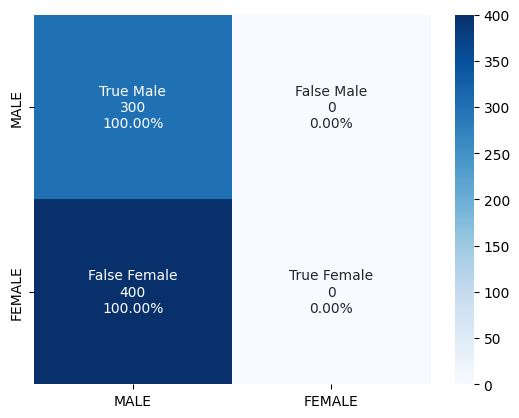

starting CAM model------------------------------------------------------
Training
Epoch 1/50
6/6 [==============================] - 124s 21s/step - loss: 0.7595 - Accuracy: 0.5000 - val_loss: 0.6901 - val_Accuracy: 0.5000
Epoch 2/50
6/6 [==============================] - 113s 19s/step - loss: 0.6927 - Accuracy: 0.5000 - val_loss: 0.6931 - val_Accuracy: 0.5000
Epoch 3/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931 - Accuracy: 0.5278 - val_loss: 0.6932 - val_Accuracy: 0.5000
Epoch 4/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931 - Accuracy: 0.5278 - val_loss: 0.6932 - val_Accuracy: 0.5000
Epoch 5/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931 - Accuracy: 0.5278 - val_loss: 0.6932 - val_Accuracy: 0.5000
Epoch 6/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931 - Accuracy: 0.5278 - val_loss: 0.6932 - val_Accuracy: 0.5000
Epoch 7/50
6/6 [==============================] - 113s 19s/step - loss: 0.6931

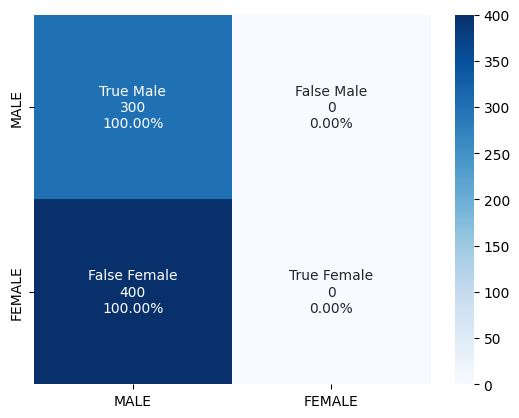


CAM volumes, class  0
1/1 [==============================] - 19s 19s/step
features shape:  (700, 8, 16, 9, 32)
results shape:   (700, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
Predicted class = 0, Probabilty = 3.9514533e-05


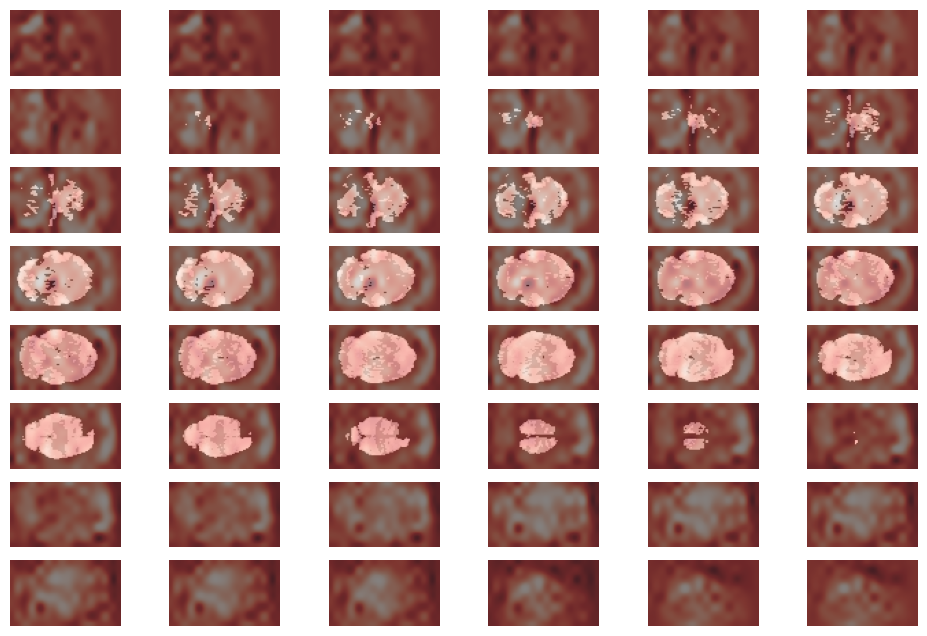

break
CAM volumes, class  1
1/1 [==============================] - 19s 19s/step
features shape:  (700, 8, 16, 9, 32)
results shape:   (700, 2)
The features for img index 0 has shape (height, width, depth, num of features channels):  (8, 16, 9, 32)
No se encontro imagen con las caracteristicas deseadas
histories and scores from CNN


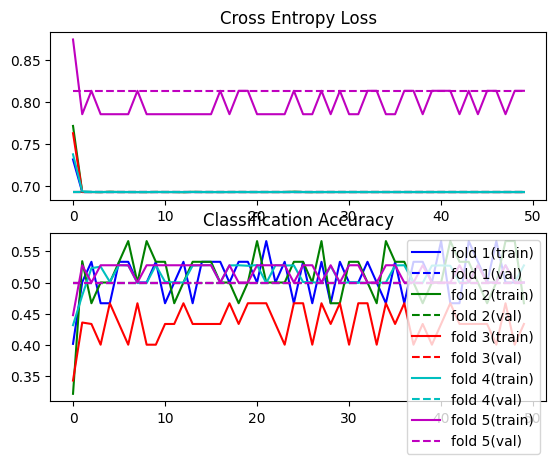

Accuracy: mean=48.658 std=9.079, n=5


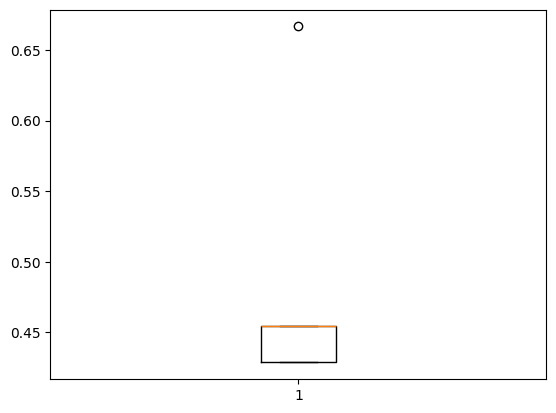

histories and scores from CNN_CAM


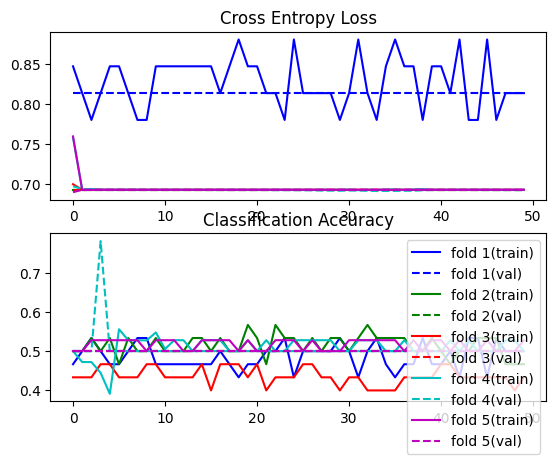

Accuracy: mean=50.476 std=9.165, n=5


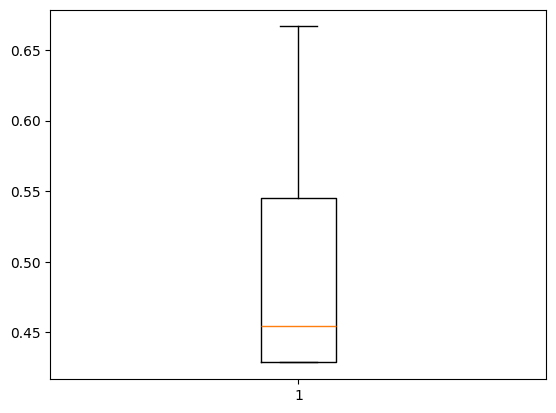

In [11]:
#Haciendo z scoring y histogram equalization en el data generator

kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

scores, histories = list(), list()
scores_cam, histories_cam = list(), list()

for train_ix, test_ix in kfold.split(subjects, labels):
    sub_train = subjects[list(train_ix)]
    sub_train, sub_val, y_train, y_val  = train_test_split(sub_train, labels[list(train_ix)], test_size=0.1, random_state=42,stratify=labels[list(train_ix)])
    sub_test = subjects[list(test_ix)]
    y_test = labels[list(test_ix)]

    #Sujetos CPH con dos sesiones
    maleCPHw1w7_train = []
    for i in range(len(sub_train)):
        if sub_train[i] in maleCPHw1w7 and y_train[i] == 1:
            maleCPHw1w7_train.append(sub_train[i])
            
    maleCPHw1w7_test = []
    for i in range(len(sub_test)):
        if sub_test[i] in maleCPHw1w7 and y_test[i] == 1:
            maleCPHw1w7_test.append(sub_test[i])
    
    maleCPHw1w7_val = []
    for i in range(len(sub_val)):
        if sub_val[i] in maleCPHw1w7 and y_val[i] == 1:
            maleCPHw1w7_val.append(sub_val[i])

    #Sujetos NAIVE tres sesiones
    maleNaive3sess_train = []
    for i in sub_train:
        if i in maleNaive3sess:
            maleNaive3sess_train.append(i)
            
    maleNaive3sess_test = []
    for i in sub_test:
        if i in maleNaive3sess:
            maleNaive3sess_test.append(i)
    
    maleNaive3sess_val = []
    for i in sub_val:
        if i in maleNaive3sess:
            maleNaive3sess_val.append(i)

    #Sujetos CPH baseline
    maleCPHBl_train = []
    for i in range(len(sub_train)):
        if sub_train[i] in maleCPHbaseline and y_train[i] == 0:
            maleCPHBl_train.append(sub_train[i])
            
    maleCPHBl_test = []
    for i in range(len(sub_test)):
        if sub_test[i] in maleCPHbaseline and y_test[i] == 0:
            maleCPHBl_test.append(sub_test[i])
    
    maleCPHBl_val = []
    for i in range(len(sub_val)):
        if sub_val[i] in maleCPHbaseline and y_val[i] == 0:
            maleCPHBl_val.append(sub_val[i])

    #CPH W1 and W7 (train, test, val)
    CPHTrain = FILES_and_LABELS(maleCPHw1w7_train, [2,3], MRI_type, functional_type)
    CPHTest = FILES_and_LABELS(maleCPHw1w7_test, [2,3], MRI_type, functional_type)
    CPHVal = FILES_and_LABELS(maleCPHw1w7_val, [2,3], MRI_type, functional_type)
        
    CPH_train_path = CPHTrain.get_mask_and_bold()
    CPH_test_path = CPHTest.get_mask_and_bold()
    CPH_val_path = CPHVal.get_mask_and_bold()
    
    #NAIVE three sessions
    NAIVE3Train = FILES_and_LABELS(maleNaive3sess_train, [1,2,3], MRI_type, functional_type)
    NAIVE3Test = FILES_and_LABELS(maleNaive3sess_test, [1,2,3], MRI_type, functional_type)
    NAIVE3Val = FILES_and_LABELS(maleNaive3sess_val, [1,2,3], MRI_type, functional_type)
        
    NAIVE3_train_path = NAIVE3Train.get_mask_and_bold()
    NAIVE3_test_path = NAIVE3Test.get_mask_and_bold()
    NAIVE3_val_path = NAIVE3Val.get_mask_and_bold()
    
    #CPH Session 1 Baseline
    BL_CPHTrain = FILES_and_LABELS(maleCPHBl_train, [1], MRI_type, functional_type)
    BL_CPHTest = FILES_and_LABELS(maleCPHBl_test, [1], MRI_type, functional_type)
    BL_CPHVal = FILES_and_LABELS(maleCPHBl_val, [1], MRI_type, functional_type)
        
    BL_CPH_train_path = BL_CPHTrain.get_mask_and_bold()
    BL_CPH_test_path = BL_CPHTest.get_mask_and_bold()
    BL_CPH_val_path = BL_CPHVal.get_mask_and_bold()
        
    X_train = CPH_train_path+NAIVE3_train_path+BL_CPH_train_path
    X_test =  CPH_test_path+NAIVE3_test_path+BL_CPH_test_path
    X_val = CPH_val_path+NAIVE3_val_path+BL_CPH_val_path

    print("sub train:")
    print(np.array(X_train)[:,0])
    print("sub test:")
    print(np.array(X_test)[:,0])
    print("sub val:")
    print(np.array(X_val)[:,0])

    print("# sesiones CPH (W1 and W7) Train",len(CPH_train_path))
    print("# sesiones NAIVE (3 sessions) Train",len(NAIVE3_train_path))
    print("# sesiones CPH baseline Train",len(BL_CPH_train_path))

    print("# sesiones Train",len(X_train))
    print("# sesiones Test",len(X_test))
    print("# sesiones Val",len(X_val))
    
    traingen = CustomDataGen(X_train, batch_size=6, format = "just_brain", vols = 100, num_class = 2, classes = "CPHvsNAIVEmale")
    #Es necesario que la division entre X_test y batch_size tenga un modulo igual a 0. De otra manera el ultimo batch no lo utiliza al utilizar .predict
    testgen  = CustomDataGen(X_test, batch_size=1, format = "just_brain", vols=100, num_class = 2, classes = "CPHvsNAIVEmale")
    valgen  = CustomDataGen(X_val, batch_size=len(X_val), format = "just_brain",vols=100, num_class = 2, classes = "CPHvsNAIVEmale")
    
    #getting model 3D CNN
    #callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, min_delta=0.0001)
    print("Starting 3D CNN-----------------------------------------------------")
    CNN = Conv3dNN_from_paper(n_class = 2)
    CNN.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN.fit(traingen, epochs=50, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN): {}'.format(end_time - start_time))

    y_test=[]
    for i in range(int(len(X_test)/1)):
        x,y = testgen[i]
        y_test.extend(y)
    y_test = np.argmax(y_test, axis=1)
    
    print("predicts CNN")
    preds = tf.cast(tf.argmax(CNN.predict(testgen), axis=1), tf.int32)
    
    print("evaluating CNN")
    _,acc = CNN.evaluate(testgen, verbose=1)
    
    scores.append(acc)
    histories.append(history)
    
    print("CM CNN")
    confusionmatrix(y_test, preds)
    
    #CNN CAM
    print("starting CAM model------------------------------------------------------")
    CNN_cam = Conv3dNN_cam_from_paper(n_class = 2)
    CNN_cam.compile(loss=tf.nn.softmax_cross_entropy_with_logits, optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                    metrics=["Accuracy"])
    
    start_time = datetime.now()
    
    print("Training")
    history = CNN_cam.fit(traingen, epochs=50, validation_data = valgen, shuffle=True)

    end_time = datetime.now()
    print('Duration (CNN_cam): {}'.format(end_time - start_time))
    
    print("predicts CNN_cam")
    preds = tf.cast(tf.argmax(CNN_cam.predict(testgen), axis=1), tf.int32)
    
    print("evaluating CNN_cam")
    _,acc = CNN_cam.evaluate(testgen, verbose=1)
    
    scores_cam.append(acc)
    histories_cam.append(history)
    
    print("CM CNN_cam")
    confusionmatrix(y_test, preds)
    print("")
    
    for i in range(2):
        print('CAM volumes, class ',i)
        CAM_generator(CNN_cam, i, 1,testgen)
        
print("histories and scores from CNN") 
summarize_diagnostics(histories)
summarize_performance(scores)

print("histories and scores from CNN_CAM") 
summarize_diagnostics(histories_cam)
summarize_performance(scores_cam) 